## 1. Introduction and motivation

As stated in the introduction in the website *We have chosen to dig into the vast world of great thinkers throughout history. Our motivation is to learn more about the thinkers and the ideas that have helped shape how the world and the cultures in it have evolved. Especially whom the most influential people have been in this development - those who have made the greatest impact on subsequent thinkers. Our theory is that the most influential philosophers are the ones whom have proposed the most radical and original ideas - and that's worth further analysis. We are also interested in, how the sentiment of philosophy has evolved over time. Whether is has notably evolved a all. If it in, one way or another, correlates with renowned periods history, and maybe even whether philosophers are a driving force in the development of society or whether they are mere products of their time representing the contemporary ideas.*

To dig into that we have aimed to make a website, which allows its users to navigate pleasantly through the ideas of philosophy throughout the years, and gain some insights on emergent properties of nearly 3000 years of philosophy as a whole. We do this using what we know of network characteristics and natural language processing.

Our goal is for the users with a limited knowledge of philosophy to get a brief introduction to the field, put into a historical context, which might spark their interests. For users with some knowledge of philosophy (that's the audience we belong to ourselves), our goal is to shed light on previously unknown aspects of the field; are there any influential persons, who have been overlooked? Or are there trends in sentiments which might change our views of certain eras of history? Or do philosophers by their sheer influence group together in ways we will be able to detect with network analysis? Those are questions we will examine - together with the users of the site. For users with a great experience with and/or knowledge of philosophy we might not be able to provide new information, but hopefully we will be able to entertain with aesthethically pleasing visualizations of the networks we have created - with a mutual interest in mind.

How are the philosophers connected as a network one might ask? We have created the network having the philosphers as nodes and connecting each philosopher with a directed link if there is strong indication of them having had an influence on their school of thought.
	
The philosophers are connected in the network, if Wikipedia list them as being influenced by or having influenced other philosophers in the network.
When analyzing the results, the terms _philosophers_, _thinkers_ and _people_ will be used interchangeably. When referring to _influential persons_ or anything regarding the _most influential_ or _most connected_ we refer specifically to the philosophers of our network.

#### This leads to our data:

Our data set is nothing less than the greatest philosophers of history.

To obtain data on this, we have relied on Wikipedia to provide a list with names. The names for out network originates from the four Wikipedia-lists of philosophers throughout history listed alphabetically*.
The lists are very inclusive. In the analysis we have encountered persons not usually associated (at least primarily) with philosophy. That be people more commonly associated with politics (Vladimir Lenin, Leon Trotsky, Benjamin Franklin), science (Isaac Newton, Hans Christian Ørsted, Nikolau Copernicus), psychology (Sigmund Freud, Carl Jung) and writing (Fyodor Dostoyevsky, Marcel Proust, C.S. Lewis). We have chosen to keep these people in the list - both because it, to us, show how the world history in intertwined among all different fields of human culture, thus making the analysis deprived, if we were to remove them, and also because the term "philosopher" is not necessarily a strictly defined term. If someone by their acts or writings have help spark new ideas or the mind of forthcoming people, is he or she not a philosopher? We are not the ones who are to settle that question. But we have chosen to regard every influential individual in the list(s) as a philosopher.

The lists are actually so inclusive some people in the list does not have a Wikipedia-page in English or have little to no information on their page. We will get back to dealing with this issue in the next section.

There are two primary advantages using the Wikipedia-texts: they act as one common source of information leaving only one weak spot (that indeed is a controversial source to some) regarding source criticism, and in addition it is often explicitly listed whom they been influenced by and whom they have influenced, which makes the analysis simpler.

\* The link for the lists are:
- `https://en.wikipedia.org/wiki/List_of_philosophers_(A%E2%80%93C)`
- `https://en.wikipedia.org/wiki/List_of_philosophers_(D%E2%80%93H)`
- `https://en.wikipedia.org/wiki/List_of_philosophers_(I%E2%80%93Q)`
- `https://en.wikipedia.org/wiki/List_of_philosophers_(R%E2%80%93Z)`




## 2. Basic statistics and cleaning the data set


First and foremost we make our imports and set our initial layout conditions. Then we extract the names from the lists mentioned above.

In [1]:
# Import all necessary libraries

#!pip install urllib2
import pandas as pd
import matplotlib.pyplot as plt
import json
import urllib.request
import re
import networkx as nx
import numpy as np
import cycler
import math
#import seaborn as sns
from pandas import DataFrame

In [2]:
# Setting up plot layouts:
# Heavily inspired by: https://towardsdatascience.com/cyberpunk-style-with-matplotlib-f47404c9d4c5

plt.style.use("seaborn-darkgrid")

for p1,p2,p3 in zip(['figure.facecolor', 'axes.facecolor', 'savefig.facecolor', 'savefig.facecolor'],['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color'],['font.size', 'xtick.labelsize', 'ytick.labelsize', 'ytick.labelsize']):
    plt.rcParams[p1], plt.rcParams[p2], plt.rcParams[p3] = '#212946', '0.95', '16'

plt.rcParams['figure.figsize']=(10, 5)
plt.rcParams['lines.linewidth'] = 3.0
plt.rcParams['legend.frameon'] = 'True'
plt.rcParams['legend.facecolor'] = '004466'
plt.rcParams['legend.edgecolor'] = '004466'
plt.rcParams['legend.framealpha'] = 0.8
plt.rcParams["image.cmap"] = "inferno"
plt.rcParams["axes.prop_cycle"] = cycler.cycler(color=[u'#00ff00',u'#ffff00',u'#00ffff',u'#ff00ff',u'#ffaa00',u'#ff0000',u'#0000ff',u'#00aa00',u'#aaaa00',u'#038273',u'#7d0ec2',u'#822d13',u'#720303',u'#000022'])


#### Extracting the names of the philosophers

We use the four lists to create a list of philosophers with help of the urllib, json and RegEx modules.

In [3]:
listOfPhil = ["List_of_philosophers_(A%E2%80%93C)", "List_of_philosophers_(D%E2%80%93H)", "List_of_philosophers_(I%E2%80%93Q)", "List_of_philosophers_(R%E2%80%93Z)"]

In [4]:
for x in listOfPhil:
    #construct query
    baseurl = "https://en.wikipedia.org/w/api.php?"
    action =  "action=query&prop=revisions"
    title = "titles=" + x
    content = "rvslots=*&rvprop=content"
    dataformat = "formatversion=2&format=json"

    query='%s%s&%s&%s&%s'% (baseurl,action,title,content,dataformat)
    # Save response and iterate trough JSON object to get to the content
    wikiresponse=urllib.request.urlopen(query)
    wikidata=wikiresponse.read()
    wikitext=wikidata.decode('utf-8')
    wikipages=json.loads(wikitext)["query"]["pages"]
    content = wikipages[0]["revisions"][0]["slots"]["main"]["content"]
    # Save content of list
    data = open("./lists/" + x, "w+", encoding="utf-8")
    data.write(content)
    data.close()

# Go through each list and find all names using regex
allNamesRaw = []
for x in listOfPhil[:]:
    wikiFile = open("./lists/" + x,'r',encoding='utf-8').read()
    tempNames = re.findall(r'\[\[.*?\n' , wikiFile)
    allNamesRaw = allNamesRaw + tempNames[1:-9]

In [5]:
# Number of people extracted from the list:
print(len(allNamesRaw))

1764


#### The Cleaning process

This is where the cleaning of the data is initiated. The first and foremost cleaning is of the dates of the philosophers. This is used to make the time line.

In [6]:
# Cleaning the data with regards to time period
personNames = []
personDates = []
personSurNames = []
personFirstNames = []

personBorn = []
personDied = []
personTimeMisc = []

for name in allNamesRaw:
    print(name)
    person = name[2:].split("{{")
    person = person[0].split("]] ")
    personName = person[0]
    print(personName)
    try:
        alternateNameAndDate = person[1].split("(")[1:]
        alternateNameAndDate = alternateNameAndDate[-1]
        alternateNameAndDate = alternateNameAndDate.split("\n")
        alternateNameAndDate = alternateNameAndDate[0].split(")")
        alternateNameAndDate = alternateNameAndDate[0]
    
        personNames.append(personName)

        namesDividedTemp = personName.split('|')
        for word in namesDividedTemp:
            if ',' in word:
                namesDivided = word.split(' ')
                break
            else:
                namesDivided = namesDividedTemp[-1].split(' ')

        for word in namesDivided:
            if ',' in word:
                tempSurname = word.split(',')[0]
                print(tempSurname)
                break
            else:
                tempSurname = namesDivided[-1]
        
        personSurNames.append(tempSurname)

        if tempSurname == namesDivided[0]:
            personFirstNames.append(None)
        else:
            personFirstNames.append(namesDivided[0])


        century_words = ['5th century BC','4th century BC','3rd century BC',
                        '2nd century BC','1st century BC',
                        '1st ', '2nd ', '3rd ', '4th ', '5th ', '6th ', '7th ',
                        '8th ', '9th ', '10th ', '11th ', '12th ', '13th ', '14th ',
                        '15th ', '16th ', '17th ', '18th ', 'circa 300 BC', '300 BC', '70 BC', '400 BC', '460 BC', '250 BC', '700 BC']
        centuries = [-500, -400, -300, -200, -100, 0, 100, 200, 300, 400, 500, 600, 700,
                    800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, -300, -300, -70, -400, -460, -250, -700]
        
        bool_switch = False
        for year, word in zip(centuries,century_words):
            if word in alternateNameAndDate:
                personBorn.append(year)
                personDied.append(year+75)
                personTimeMisc.append(alternateNameAndDate)
                bool_switch = True
                break

        datesTemp = alternateNameAndDate.split('–')
        datesTemp_ = alternateNameAndDate.split('-')

        if not bool_switch:
            if len(datesTemp) == 2:
                try:
                    bornTemp, diedTemp = int(datesTemp[0]), int(datesTemp[1])
                    personBorn.append(bornTemp)
                    personDied.append(diedTemp)
                    personTimeMisc.append(None)
                except:                
                    try:
                        bornTemp = re.sub("[^0-9]", "",datesTemp[0])
                        diedTemp = re.sub("[^0-9]", "",datesTemp[1])
                        bornTemp, diedTemp = int(bornTemp), int(diedTemp)
                        if bornTemp > diedTemp:
                            bornTemp, diedTemp = -bornTemp, -diedTemp
                        personBorn.append(bornTemp)
                        personDied.append(diedTemp)
                        personTimeMisc.append(alternateNameAndDate)
                    except:
                        personBorn.append(None)
                        personDied.append(None)
                        personTimeMisc.append(alternateNameAndDate)
            elif len(datesTemp_) == 2:
                try:
                    bornTemp = re.sub("[^0-9]", "",datesTemp_[0])
                    diedTemp = re.sub("[^0-9]", "",datesTemp_[1])
                    bornTemp, diedTemp = int(datesTemp_[0]), int(datesTemp_[1])
                    personBorn.append(bornTemp)
                    personDied.append(diedTemp)
                    personTimeMisc.append(None)
                except:
                    personBorn.append(None)
                    personDied.append(None)
                    personTimeMisc.append(alternateNameAndDate)

            else:
                datesTemp = alternateNameAndDate.split(' ')
                dtemp = 'temp'
                if 'born' in datesTemp or '(born' in datesTemp:
                    for a_dtemp in datesTemp:
                        try:
                            dtemp = int(a_dtemp)
                            personBorn.append(dtemp)
                            personDied.append(dtemp+75)
                        except:
                            pass
                    personTimeMisc.append(alternateNameAndDate)
                    if type(dtemp) == str:
                        personBorn.append(None)

                elif 'died' in datesTemp:
                    for a_dtemp in datesTemp:
                        try:
                            dtemp = int(a_dtemp)
                            personDied.append(dtemp)
                            personBorn.append(dtemp-75)
                        except:
                            pass
                    personTimeMisc.append(alternateNameAndDate)
                    if type(dtemp) == str:
                        personBorn.append(None)
                        personDied.append(None)

                else:    
                    personBorn.append(None)
                    personDied.append(None)
                    personTimeMisc.append(alternateNameAndDate)

        #print(len(personNames), len(personBorn), len(personDied), len(personTimeMisc))
        #print(personNames[-1])
        #print(personFirstNames[-1], personSurNames[-1])
        #print(personBorn[-1], personDied[-1], personTimeMisc[-1])
        #print()
        '''
        if len(personNames) > 25:
            break
        
        
        personDate = person[1:]

        fails_variable = 0
        success_variable = 0
        test_var = 0
        for parenthesis in person[1:]:
            if re.search(r'[0-9]+', parenthesis) is not None:
                personDate = parenthesis
                personDates.append(personDate)
                success_variable = 1
                break
                
        if success_variable == 0:
            personDates.append(None)
        '''
    except:
        pass



Charles Secrétan
[[Michal Sedziwój]] (1566–1636)

Michal Sedziwój
[[John Selden]] (1584–1654){{listref|4}}

John Selden
[[Roy Wood Sellars]] (1880–1973){{listref|3}}

Roy Wood Sellars
[[Wilfrid Sellars]] (1912–1989){{listref|1}}{{listref|3}}{{listref|4}}{{listref|5}}

Wilfrid Sellars
[[Amartya Sen]] (born 1933){{listref|3}}

Amartya Sen
[[Seneca the Younger]] (c. 4 BC – AD 65){{listref|3}}{{listref|4}}

Seneca the Younger
[[Sengzhao]] (384–414){{listref|4}}

Sengzhao
[[Victor Serge]] (1890–1947)

Victor Serge
[[John Sergeant (priest)|John Sergeant]] (1623–1704){{listref|4}}

John Sergeant (priest)|John Sergeant
[[Michel Serres]] (1930-2019)

Michel Serres
[[Sextus Empiricus]] (2nd/3rd century){{listref|1}}{{listref|3}}{{listref|4}}

Sextus Empiricus
[[Anthony Ashley-Cooper, 3rd Earl of Shaftesbury]] (1671–1713){{listref|1}}{{listref|3}}{{listref|4}}{{listref|5}}

Anthony Ashley-Cooper, 3rd Earl of Shaftesbury
Ashley-Cooper
[[Shah Wali Allah]] (or ''Qutb al-Din Ahmad al-Rahim'' or ''Wal

Cleaning the data we first extracted both names and birth/death year (as they were also most often present in the four alphabetical lists) and constructed a dataframe of our findings. Whenever a birth/death year was missing (or whenever it was loosely specified, as for instance "1st century AD") the philosopher was assigned the arbitrary age of 75 as default, and the missing info was subsequently calculated to have a common offset for the analysis. That of course was not enough to catch every single special case, but out of 1763 names, only 28 remained flawed - and these will be patched manually.

Then list of philosophers and extracted information is used to create a dataframe to be used in the further analysis.

In [7]:
# Convert list to dataframe - and fix the last dates

print(len(personNames), len(personDates))

data = pd.DataFrame([])
data['Names'] = personNames
data['Last_Name'] = personSurNames
data['First_Name'] = personFirstNames
data['Year_Born'] = personBorn
data['Year_Died'] = personDied
data['Misc_Age'] = personTimeMisc
data['Id'] = data.index.values

# Patches:
data = data.replace(-410408, -410)
data = data.replace(-355347, -355)
data = data.replace(-10923, -1092)
data = data.replace(524525, 525)
data = data.replace(13278, 1328)

def Patch(whom, born, died, df):
    idx = df[df['Names'] == whom].index[0]
    df.at[idx, 'Year_Born'] = born
    df.at[idx, 'Year_Died'] = died
    return None

Patch('Albertus Magnus', 1192, 1280, data)
Patch('Diogenes of Babylon', -230, -140, data)
Patch('Abraham ibn Ezra', 1092, 1167, data)
Patch('Nagarjuna', 200, 300, data)
Patch('Nemesius of Emesa', 400, 500, data)
Patch('Philo the Dialectician', -400, -300, data)
Patch('Philo of Megara', -400, -300, data)
Patch('Giambattista della Porta', 1535, 1615, data)
Patch('Yajnavalkya', -800, -700, data)
Patch('Zeno of Tarsus', -300, -200, data)
Patch('Lucian', 120, 180, data)
Patch('Jayarāśi Bhaṭṭa', 800, 900, data)
Patch('John of Mirecourt', 1345, 1345+75, data)
Patch('Kao Tzu', -420, -420+75, data)
Patch('Kumārila Bhaṭṭa', 700, 700+75, data)
Patch("Jacques Lefèvre d'Étaples", 1455, 1536, data)
Patch('Anaxarchus', -380, -320, data)
Patch('Richard FitzRalph', 1300, 1360, data)
Patch('Gangeśa', 1325, 1325+75, data)
Patch('Gregory of Rimini', 1358-75, 1358, data)
Patch('Iamblichus (philosopher)|Iamblichus', 245, 325, data)
Patch('Ibn ar-Rawandi', 910, 910+75, data)
Patch('Joseph ibn Tzaddik', 1149, 1149+75, data)

data = data.sort_values('Last_Name')


1763 0


After the patches, then duplicates are removed:

In [8]:
# Removing duplicates:
print(data[:]['Names'][data[:]['Names'].duplicated()])

data = data.drop(1254)
data = data.drop(1390)
data = data.drop(1378)
data = data.drop(1039)

1254                                 Philo of Larissa
1390    Claude Henri de Rouvroy, Comte de Saint-Simon
1378                                   Vasily Rozanov
1039                                       Mao Zedong
Name: Names, dtype: object


In [9]:
# Extending the data frame
data['Year_Died'] = np.array(data['Year_Died'], dtype=int)
data['Year_Group'] = np.round(data[data['Year_Died'] > -5000]['Year_Died']/1000, 1)*10

#### The distribution of philosophers

We looked at the number of philosophers throughout history.

Figure 1:


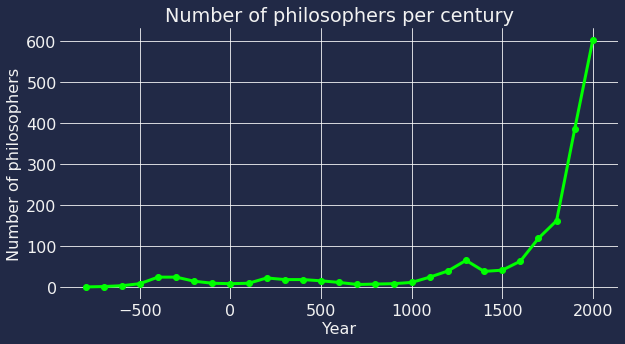

In [10]:
# Plot of number of philosophers
# Here the binning is for each century

number_of_philosophers = []
for yr in range(-8,21):
    number_of_philosophers.append(len(data[data['Year_Group'] == yr]['Names'].values))

print('Figure 1:')
import matplotlib.pyplot as plt
plt.plot(np.arange(-8,21)*100, number_of_philosophers,'-o')
plt.title('Number of philosophers per century')
plt.xlabel('Year')
plt.ylabel('Number of philosophers')
#plt.savefig('Number_o_phils'+".png", format="PNG")
plt.show()



As shown in the figure above, the number of philosophers until the 15th century is approximately constant (with the exception of a small peak around 300-400 BC - the time of the ancient Greek philosophers). 
After that, a dramatic increase is observed. This may be due to the diversity of quests that characterize philosophical thought (the reality of each is not one but many) and the revolutionary conquests of science and 
economical growth have legitimized the expansion of the definition of philosophy. In addition, it appears that philosophers after the 18th century are more connected and influential to each other. 

In the infobox of each philosopher there are names of philosophers that influenced him or got influenced by him. Those are the names we are interested in. While getting the infobox, it was noticed that some of the wikipages either did not include an infobox or could not be downloaded (the page was empty and the api returned an error) . This is why the list filter_names that contains those names was created.

In [11]:
# Downloading infobox
import os

filter_names= ['Abd al-Jabiri', 'Dorion Cairns','George Campbell (theologian)|George Campbell','George Campbell (theologian)','Mario Calderoni','Chiao Hung','Carlos Nelson Coutinho','Tasan Chông Yagyong',"Ch'en Hsien-chang",'Jonathan Earle (philosopher)|Jonathan Earle',
'Jonathan Earle (philosopher)','Elias (philosopher)|Elias','Elias (philosopher)','Raimundo de Farias Brito','Erich Frank','Gadadhara Bhattacharya',
'Joseph Geyser','titles=Tefé_Holland','Axel Anders Theodor Hagerstrom','Han Wonjin','Carl Heim','Ronald William Hepburn','Sergei Iosifovich Hessen','Hu Hung','Friedrich Jodl','Jørgen Jørgensen (philosopher)|Jørgen Jørgensen','Lev Platonovich Karsavin',
'Jørgen Jørgensen (philosopher)','Lev Platonovich Karsavin','Joseph Kaspi','Aleksei Aleksandrovich Kozlov','Lucien Laberthonnière','Jules Lachelier','Ivan Ivanovich Lapshin','Li Ao (722–841)|Li Ao',
'Li Ao (722–841)','Liang Sou-ming','Arthur Liebert','Liu Tsung-chou','Dickinson Miller','Minagawa Kien','Mou Tsung-san','John Wood Oman','James Oswald (philosopher)|James Oswald',
'James Oswald (philosopher)','William Penbygull','Joseph Petzoldt','Pseudo-Grosseteste','Rgyal tshab dar ma rin chen',"T'ang Chun-i",'George Turnball','Gabriel Vazquez','Boris Petrovich Vysheslavtsev','Ota Weinberger','Frantisek Weyr','Timothy K. Wong','Yi Kan','Xavier Zubiri']

if len(os.listdir('./pageContent/')) < 800:

    philCounter1 = 0
    for philosopher in data['Names']:
        print(philosopher)
        if '|' in philosopher:
            philosopherSplit = philosopher.split('|')
            philosopherLink = philosopherSplit[0]
            print(philosopherLink)
        else:
            philosopherLink = philosopher

        if philosopherLink in filter_names: # Names of people that return a error when making an API query, get skipped
            continue
         # Construct API Query
        wikiNameURL = urllib.parse.quote(philosopherLink)
        baseurl = "https://en.wikipedia.org/w/api.php?"
        action = "action=query"
        title = "titles=" + wikiNameURL
        content = "prop=revisions&rvprop=content&rvsection=0"
        dataformat ="format=json"

        query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)
        print(query)

        wikiresponse=urllib.request.urlopen(query)
        wikidata=wikiresponse.read()
        wikitext=wikidata.decode('utf-8')
        wikipages=json.loads(wikitext)["query"]["pages"]
        key=next(iter(wikipages))
        infobox = wikipages[key]['revisions'][0]["*"]
        # Save infobox content in file
        infoboxData = open("./infoboxData/" + philosopher + "_infoBox", "w+", encoding="utf-8")
        infoboxData.write(infobox)
        infoboxData.close()
        philCounter1 = philCounter1 + 1

    print(philCounter1)

#### Creation of the Network

We decided to create a directed network in order optimize the visualisation of the influence of/for each philosopher. After downloading the infoboxes, we detected the stings 'influences'
 and 'influenced' in the infoboxes using the RegEx module. If a philosopher influences some other philospher, that is apart of the 4 lists downloaded initially, than an edge is created from the philosopher to the that one that is influenced. This also works the other way around, if a philosopher is influenced by some other influencing philosopher, an edge is created from the influencing philosopher to the influenced. The result of this is a 833 node network, depicting philosophers who influence one another. This resulted in a total number of 2389 edges. 

In [12]:
# SEARCH FOR INFLUENCES/INFLUENCED IN INFOBOX, AND MAKE NODES
G = nx.DiGraph()
#dataUsed = pd.DataFrame()
dataUsedList = []
# Generate file path from name
for philosopher in data['Names']:
    if '|' in philosopher:
        philosopherSplit = philosopher.split('|')
        philosopherLink = philosopherSplit[0]
    else:
        philosopherLink = philosopher

    if philosopherLink in filter_names: # Names of people that return a error when making an API query, get skipped
       continue

    # Read infobox file for each philosopher
    path = "./infoboxData/" + philosopher + "_infoBox"
    infoBoxFile = open(path,'r',encoding='utf-8').read()
   
    # Find influences/influenced string in infobox
    influences = re.findall(r'influences\s* = (.*)', infoBoxFile)
    influenced = re.findall(r'influenced\s* = (.*)', infoBoxFile)
    # Find names (people) in string
    influencesNames = re.findall(r'\[\[.*?\]\]', str(influences))
    influencedNames = re.findall(r'\[\[.*?\]\]', str(influenced))

    # Remove square brackets
    influencesNames = [name[2:-2] for name  in influencesNames]
    influencedNames = [name[2:-2] for name  in influencedNames]

    for influencesFoundName in influencesNames:
        if data['Names'].eq(influencesFoundName).any():  # Check if the people found are apart of our dataset
            # Add nodes and edges to graph
            influencesName = influencesFoundName
            G.add_node(influencesName)
            G.add_node(philosopher)
            G.add_edge(influencesName, philosopher)

            # Add names that are in the graph to a list
            if influencesFoundName not in dataUsedList:
                dataUsedList.append(influencesFoundName)
            
            if philosopher not in dataUsedList:
                dataUsedList.append(philosopher)         
    
    for influencedFoundName in influencedNames:
        if data['Names'].eq(influencedFoundName).any(): # Check if the people found are apart of our dataset
            # Add nodes and edges to graph
            influencedName = influencedFoundName
            G.add_node(influencedName)
            G.add_node(philosopher)
            G.add_edge(philosopher, influencedName)

            # Add names that are in the graph to a list
            if influencedFoundName not in dataUsedList:
                dataUsedList.append(influencedFoundName)
            
            if philosopher not in dataUsedList:
                dataUsedList.append(philosopher)

#### Basic Statistics of the Network

In [13]:
print(nx.info(G))

Name: 
Type: DiGraph
Number of nodes: 833
Number of edges: 2389
Average in degree:   2.8679
Average out degree:   2.8679


In [14]:
# Updating the dataframe to only include the nodes from the network

nodeNamesList = list(dataUsedList)
nodeNamesDf = pd.DataFrame(nodeNamesList,columns =['Names'])

filter_arr = nodeNamesDf[:].values.flatten()

data.index = data['Names'].values
data = data.T[filter_arr].T.sort_values('Last_Name')
data.index = data['Id']

## 3. Tools, theory and analysis

Now onwards to the data analysis.

The next code block shows the top 5 most connected nodes, which all seem to be well known names in the philosophy world.

In [15]:
def secElem(e):
    return e[1]

deg=list(G.degree()) #Find degrees of all nodes and put in list
deg.sort(key=secElem, reverse=True) #sort the degrees, using secElem which select the second item in each list entry (the degree), save in decending order

for n in deg[0:5]:
    inDeg = G.in_degree(n[0])
    outDeg = G.out_degree(n[0])
    print("The degree for character node, " + n[0] + ":")
    print("    In-degree:          " + str(inDeg))
    print("    Out-degree:         " + str(outDeg))
    print("    Total degree count: " + str(n[1]))


The degree for character node, Aristotle:
    In-degree:          5
    Out-degree:         85
    Total degree count: 90
The degree for character node, Immanuel Kant:
    In-degree:          12
    Out-degree:         74
    Total degree count: 86
The degree for character node, Karl Marx:
    In-degree:          26
    Out-degree:         54
    Total degree count: 80
The degree for character node, Plato:
    In-degree:          7
    Out-degree:         64
    Total degree count: 71
The degree for character node, Ludwig Wittgenstein:
    In-degree:          16
    Out-degree:         29
    Total degree count: 45


#### Downloading of pages

After downloading the infoboxes and using that information to create the network, a list of names included in that network was created. This list will now be used to download the actual wikipedia page of each philosopher apart of the network, for futher analysis.



In [16]:
# Download function
# Addition: Ability to turn prints on/off

def downloadPage(pageTitle, printz=True):
    # construct API query
    baseurl = "https://en.wikipedia.org/w/api.php?"
    action = "action=query"
    title = "titles=" + pageTitle
    content = "prop=revisions&rvprop=content"
    dataformat ="format=json"
    if printz:
        print(pageTitle)
    query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)
    if printz:
        print(query)

    path = './pageContent/'

    wikiresponse = urllib.request.urlopen(query) # API call to wikipedia in order to get the page
    wikidata = wikiresponse.read() # turn response to python object
    wikitext = wikidata.decode('utf-8') # decode

    # Iterate through the json object in order to the get content
    wikijson = json.loads(wikitext)["query"]["pages"]
    key=next(iter(wikijson))
    wikiContent = wikijson[key]["revisions"][0]["*"]
    # Save page content to file
    charFile = open(path + philosopher +"_pageContent", "w", encoding="utf-8")
    charFile.write(wikiContent)
    charFile.close()
    if printz:
        print("done")

#### Downloading pages for all philosophers that are apart of previously created network

In [17]:
# Downloading of wiki-texts and assembling of network
import os

#filter_titles=["Jos%C3%A9%20Ortega%20y%20Gasset%7CJ.%20Ortega%20y%20Gasset","Proclus%7CProclian","Philippe%20Lacoue-Labarthe%7CLacoue-Labarthe","Emil%20Fackenheim%7CFackenheim","Karl%20Wilhelm%20Friedrich%20Schlegel%7CK.%20W.%20F.%20Schlegel","Leo%20Strauss%7CL.%20Strauss","Pierre%20d%5C%27Ailly%7CPeter%20of%20Ailly","David%20Papineau%7CD.%20Papineau","Oets%20Kolk%20Bouwsma%7COets%20Kolk%20%28O.K.%29%20Bouwsma",'Andrew%20Seth%20Pringle-Pattison%7CA.%20Seth%20Pringle-Pattison','Baron%20d%5C%27Holbach', 'Emil%20Ludwig%20Fackenheim%7CFackenheim', 'Mario%20Bunge%7CM.%20Bunge', 'Avital%20Ronell%7CRonell', "Paul%20Ric%C5%93ur%7CRic%C5%93ur"]
if len(os.listdir('./pageContent/')) < 800:
    generated_filter_titles = []
    path = "./pageContent/"
    for philosopher in data['Names']:
        if '|' in philosopher:
            philosopherSplit = philosopher.split('|')
            wikiName = philosopherSplit[0]
        else:
            wikiName = philosopher

        try:
            if wikiName != "nan":
                wikiNameURL = urllib.parse.quote(wikiName)
                downloadPage(str(wikiNameURL), printz=False)
        except:
            generated_filter_titles.append(wikiName)

    print('Unsuccessful attempts:')
    print(len(generated_filter_titles), generated_filter_titles)

    # The unsuccesfull attempts were due to either bad formatting or Russel Hanson

    generated_filter_titles_2gen = []
    for failedName in generated_filter_titles:
        revisitedName = failedName.split('|')[0]  
        try:
            wikiNameURL = urllib.parse.quote(revisitedName)
            downloadPage(str(wikiNameURL), printz=False)
        except:
            generated_filter_titles_2gen.append(revisitedName)

    print('Unsuccessful attempts:')
    print(len(generated_filter_titles_2gen), generated_filter_titles_2gen)


    # Fixing the remainders. His name is Norwoord Russell Hanson.

    RussellHanson = []
    for failedName in generated_filter_titles_2gen:
        revisitedName = failedName.replace("\\'", "'")
        try:
            wikiNameURL = urllib.parse.quote(revisitedName)
            downloadPage(str(wikiNameURL), printz=False)
        except:
            RussellHanson.append(revisitedName)

    try:
        NorwoodRussellHanson = RussellHanson[0]
        NorwoodRussellHanson = 'Norwood ' + NorwoodRussellHanson
        wikiNameURL = urllib.parse.quote(NorwoodRussellHanson)
        downloadPage(str(wikiNameURL), printz=False)
    except:
        pass

#### Community Detection

We use the module _community_ which according to its documentation
uses the Louvain-algorithm.



In [18]:
!pip install python-louvain
!pip install community
!pip3 install --upgrade networkx
from community import community_louvain

You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.
Requirement already up-to-date: networkx in /opt/venv/lib/python3.7/site-packages (2.5)
You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.


In [19]:
# Finding communities using the greedy Louvain method
H = G.to_undirected()
dataPartitions = community_louvain.best_partition(H)

dictCommunities = dataPartitions.items()
pdCommunities = pd.DataFrame.from_dict(dictCommunities)
pdCommunities = pdCommunities.rename(columns={0: 'Names', 1: "Community"})
try:
    data = data.drop('Community', axis=1)
except:
    pass
data = data.join(pdCommunities.set_index('Names'), on='Names')

print('Number of communities:', max(data['Community'])+1)

data.sort_values('Community')

Number of communities: 14


,Names,Last_Name,First_Name,Year_Born,Year_Died,Misc_Age,Id,Year_Group,Community
Id,,,,,,,,,
2,Peter Abelard,Abelard,Peter,1079,1142,None,2,11,0
249,Walter Burley,Burley,Walter,1275,1345,c. 1275–c. 1345,249,13,0
1159,John Henry Newman,Newman,John,1801,1890,None,1159,19,0
629,Gregory of Nazianzus,Nazianzus,Gregory,329,389,None,629,4,0
1150,Hossein Nasr,Nasr,Hossein,1933,2008,born 1933,1150,20,0
...,...,...,...,...,...,...,...,...,...
1360,Francisco Romero (philosopher)|Francisco Romero,Romero,Francisco,1891,1962,None,1360,20,11
1071,James Clerk Maxwell,Maxwell,James,1831,1879,None,1071,19,12
490,Michael Faraday,Faraday,Michael,1791,1867,None,490,19,12


The interval studied was splitted in 10 periods (from prehistory to 0, 0-500, 500-1000, 1000-1500,1500-1600, 1600-1700, 1700-1800, 1800-1900, 1900-1950, 1950-2000).

In [20]:
# Making the Historic Groups (philosophers ordered by historic presence)

def getYear(start, end, df=data):
    midAge = df['Year_Born'] + (df['Year_Died']-df['Year_Born'])/2
    mTemp = (midAge > start).values * (midAge <= end).values
    return mTemp

MmName = ['-1000-0', '0-500', '500-1000', '1000-1500', '1500-1600', '1600-1700', '1700-1800', '1800-1900', '1900-1950', '1950-2000']
MmSpan = [(-1000,0), (0,500), (500,1000), (1000,1500), (1500,1600), (1600,1700), (1700,1800), (1800,1900), (1900,1950), (1950,2000)]

data['Historic'] = '0'
data['HistoricGroup'] = 0
i = 0
for m in MmSpan:
    data['Historic'][getYear(m[0],m[1])] = str(m[0])+'-'+str(m[1])
    data['HistoricGroup'][getYear(m[0],m[1])] = i
    i += 1

historicNamesList = []
historicNamesListLen = []

for m in MmSpan:
    historicNamesList.append(data['Names'][getYear(m[0],m[1])].values)
    historicNamesListLen.append(len(data['Names'][getYear(m[0],m[1])].values))


print('Number of Philosphers by ')
for years,nPeeps in zip(MmName, historicNamesListLen):
    print(years, ':', nPeeps)

data

/opt/venv/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/opt/venv/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
Number of Philosphers by 
-1000-0 : 53
0-500 : 32
500-1000 : 7
1000-1500 : 65
1500-1600 : 26
1600-1700 : 41
1700-1800 : 68
1800-1900 : 167
1900-1950 : 182
1950-2000 : 192


,Names,Last_Name,First_Name,Year_Born,Year_Died,Misc_Age,Id,Year_Group,Community,Historic,HistoricGroup
Id,,,,,,,,,,,
2,Peter Abelard,Abelard,Peter,1079,1142,None,2,11,0,1000-1500,3
3,Miguel Abensour,Abensour,Miguel,1939,2017,None,3,20,1,1950-2000,9
9,Robert Merrihew Adams|Robert Adams,Adams,Robert,1937,2012,born 1937,9,20,2,1950-2000,9
768,Yahya ibn Adi,Adi,Yahya,893,974,None,768,10,0,500-1000,2
13,Alfred Adler,Adler,Alfred,1870,1937,None,13,19,2,1900-1950,8
...,...,...,...,...,...,...,...,...,...,...,...
20,Pierre d'Ailly,d'Ailly,Pierre,1350,1420,None,20,14,0,1000-1500,3
380,Jean le Rond d'Alembert,d'Alembert,Jean,1717,1783,None,380,18,1,1700-1800,6
730,Baron d'Holbach,d'Holbach,Baron,1723,1789,None,730,18,3,1700-1800,6


#### Extending the dataframe (here with the degree)

In [21]:
# Connecting Degrees to the DataFrame data + adding node sizes to be used for visualizations
degDf = pd.DataFrame([])
degArr = np.array(deg)
degDf['Names'] = degArr.T[0]
degDf['Degree'] = degArr.T[1]
degDf = degDf.sort_values('Names')
data = data.sort_values('Names')

data['Degree'] = np.array(degDf['Degree'].values, dtype=int)
data['NodeSize'] = np.array(degDf['Degree'].values, dtype=float)*100
data['NodeSizeVar'] = np.array(degDf['Degree'].values, dtype=float)*550
data['NodeSizeLog'] = np.log(np.array(degDf['Degree'].values, dtype=float)+1)*2500

data[['Names', 'Degree', 'NodeSize', 'NodeSizeLog']].sort_values('Degree', ascending=False)


,Names,Degree,NodeSize,NodeSizeLog
Id,,,,
75,Aristotle,90,9000.0,11277.148766
847,Immanuel Kant,86,8600.0,11164.770297
1064,Karl Marx,80,8000.0,10986.122887
1262,Plato,71,7100.0,10691.665298
1709,Ludwig Wittgenstein,45,4500.0,9571.603491
...,...,...,...,...
81,Matthew Arnold,1,100.0,1732.867951
1100,Mary Midgley,1,100.0,1732.867951
690,Claude Adrien Helvétius,1,100.0,1732.867951


In [22]:
# Adding color codes dependent on the time of the philosopher
import matplotlib

n = len(range(-8, 21))
color_map = plt.cm.get_cmap('plasma', n)

color_codes = []
for i in range(-8, 21):
    color_codes.append(color_map(i))

colorDf = pd.DataFrame([])

colorDf['Year_Group'] = list(range(-8, 21))
colorDf['ColorsTime'] = color_codes
try:
    data = data.drop('ColorsTime', axis=1)
except:
    pass
data = data.join(colorDf.set_index('Year_Group'), on='Year_Group')

#### Examining Network Properties

In [23]:
# Concrete network properties of the full network:
print(nx.info(G))

pd.DataFrame(G.degree).sort_values(1, ascending=False)

Name: 
Type: DiGraph
Number of nodes: 833
Number of edges: 2389
Average in degree:   2.8679
Average out degree:   2.8679


,0,1
0,Aristotle,90
89,Immanuel Kant,86
38,Karl Marx,80
13,Plato,71
70,Ludwig Wittgenstein,45
...,...,...
337,Samuel Clarke,1
318,Jacob Burckhardt,1
317,Emile Meyerson,1
658,Louis Gabriel Ambroise de Bonald,1


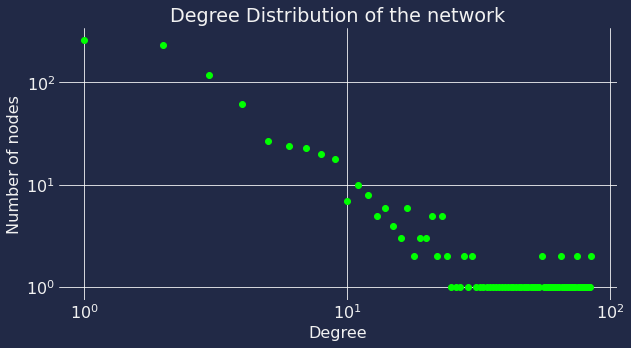

(array([257, 228, 118,  61,  26,  23,  22,  19,  17,   6,   9,   7,   4,
          5,   3,   2,   5,   1,   2,   2,   4,   1,   4,   1,   0,   0,
          0,   1,   0,   1,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   1]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
        26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
        39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51.,
        52., 53., 54., 55., 56., 57., 58., 59., 60., 61., 62., 63., 64.,
        65., 66., 67., 68., 69., 70., 71., 72., 73., 74., 75., 76., 77.,
        78., 79., 80., 81., 82., 83., 84., 85.]))

In [24]:
# Examining scale-free properties of the network

kHistList = np.array(np.array(G.degree).T[1],dtype=int)
kHistListOut = np.array(np.array(G.out_degree).T[1],dtype=int)
#kHistListOut = np.sort(kHistListOut)[::-1]
kHistListOut = np.histogram(kHistListOut, bins=85)

# Examining scale-free properties of the undirected network
'''
plt.hist(kHistList, bins=89)
plt.show()

kHistList = np.histogram(kHistList, bins=89)

fig, ax = plt.subplots()
ax.scatter(np.arange(len(kHistList[0]))+1,kHistList[0]+1)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('Degree')
ax.set_ylabel('Number of nodes')
ax.set_title('Degree Distribution of the network')
#plt.savefig('scale_free_undir.png', format='PNG')
plt.show()
'''

# Examining scale-free properties of the directed network,
# using the out-degrees
fig, ax = plt.subplots()
ax.scatter(np.arange(len(kHistListOut[0]))+1,kHistListOut[0]+1)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('Degree')
ax.set_ylabel('Number of nodes')
ax.set_title('Degree Distribution of the network')
#plt.savefig('scale_free_dir.png', format='PNG')
plt.show()

kHistListOut

## Visualization Section

#### Network-visualization

In [25]:
!pip install fa2
from fa2 import ForceAtlas2
import matplotlib.pyplot as plt

You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.


#### Setting up colors

In [26]:
color_map = plt.cm.get_cmap('gist_rainbow', max(data['Community'])+1)

color_codes = []
for i in np.arange(max(data['Community'])+1):
    color_codes.append(color_map(i))
color_codes = color_codes[::-1]

commDf = pd.DataFrame([])

commDf['Community'] = np.arange(max(data['Community'])+1)
commDf['ColorsComm'] = color_codes
try:
    data = data.drop('ColorsComm', axis=1)
except:
    pass
data = data.join(commDf.set_index('Community'), on='Community')

In [27]:
# Making colors corresponding to historic groups
color_map = plt.cm.get_cmap('gist_rainbow', max(data['HistoricGroup'])+1)

color_codes = []
for i in np.arange(max(data['HistoricGroup'])+1):
    color_codes.append(color_map(i))
color_codes = color_codes[::-1]

commDf = pd.DataFrame([])

commDf['HistoricGroup'] = np.arange(max(data['HistoricGroup'])+1)
commDf['ColorsHistoric'] = color_codes
try:
    data = data.drop('ColorsHistoric', axis=1)
except:
    pass
data = data.join(commDf.set_index('HistoricGroup'), on='HistoricGroup')

In [28]:
# Making lists of colors
import inspect
inspect.signature(nx.draw)
inspect.getfullargspec(nx.draw)

#color_codes = color_codes[::-1]

#edge_colorlist = [(1,i*1/len(G.edges),0.5,1) for i in range(len(G.edges))]

color_map = plt.cm.get_cmap('gist_rainbow', len(G.nodes)+1)

grandEdgeColorList = []
sumtemp = len(G.edges)

for i in range(len(MmName)):
    #ltemp = len(data[data['HistoricGroup'] == i]['Names'].values)
    
    Q = G.subgraph(data[data['HistoricGroup'] == i]['Names'].values)
    ntemp = len(Q.nodes)
    ltemp = len(Q.edges)
    
    edge_colorlist = []
    for _ in np.arange(ltemp):
        edge_colorlist.append(color_map(sumtemp+ntemp/2))
    #edge_colorlist = edge_colorlist[::-1]
    sumtemp -= ntemp

    #print(i, len(Q.nodes), len(edge_colorlist), sumtemp+ntemp/2)
    grandEdgeColorList.append(edge_colorlist)


Now the actual networks are generated.

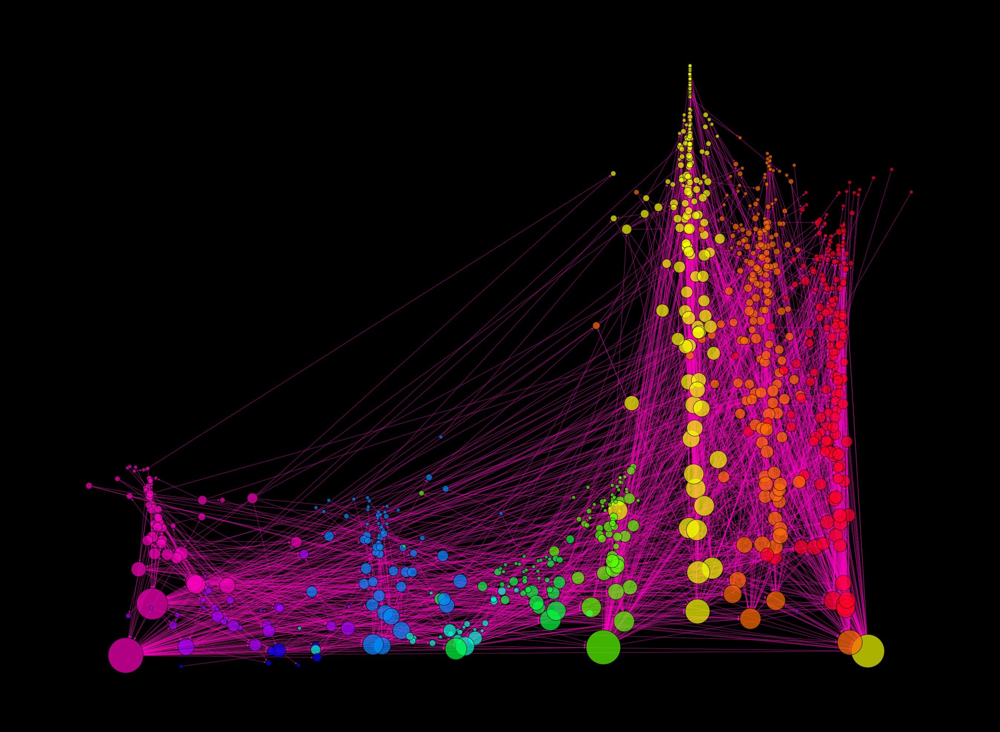

In [29]:
# Force Atlas-version

# For different variations of the Force Atlas 2-algorithm
# change i in the for loop. For a series of iteration, choose
# a list of integer values.

# i = 0 will display the network organized in initial positions;
# ordered by historic period (earlier to later, x-axis)
# and degree (high to low, y-axis)

for i in [5]:
    forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        edgeWeightInfluence=20,
                        # Performance
                        jitterTolerance=0.2, # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.6,
                        # Tuning
                        scalingRatio=0.1,
                        strongGravityMode=False,
                        gravity=-1,
                        # Log
                        verbose=False)

    hardcodedPositions = dict()
    temp_node_list = np.array(G.nodes)
    temp_data = data.sort_values(['HistoricGroup', 'Degree'], ascending=[True, False])
    verytempGroup = 0
    yValue = 0
    xValue = 0
    initi = 0
    for name in temp_data['Names']:
        tempGroup = data[data['Names'] == name]['HistoricGroup'].values[0]
        tempDegree = data[data['Names'] == name]['Degree'].values[0]

        xValue = tempGroup
        if initi !=0:
            yValue += tempDegree**1.2*20+20
        if tempGroup != verytempGroup:
            yValue = 0
        verytempGroup = tempGroup*1

        hardcodedPositions[name] = (xValue,yValue)
        initi = 1

    positions = forceatlas2.forceatlas2_networkx_layout(G, pos=hardcodedPositions, iterations=i)
    
    fig, ax = plt.subplots(figsize=(48,36))
    nx.draw(G, positions,
            nodelist=list(data['Names'].values),
            node_color=data['ColorsHistoric'].values,
            node_size=data['NodeSize'].values,
            linewidths=1.5,
            edgecolors='black',
            edge_color=edge_colorlist,
            alpha=0.7,
            with_labels=False) #, font_size=11, font_color='#FFFFFF')#656464
    
    ax.set_facecolor('black')
    ax.axis('off')
    fig.set_facecolor('black')
    #plt.savefig("MasterGraph_Iter"+str(i).zfill(3)+".png", format="PNG")
    plt.show()
    

0.: -1000-0
Name: 
Type: DiGraph
Number of nodes: 53
Number of edges: 90
Average in degree:   1.6981
Average out degree:   1.6981
             0   1
33       Plato  15
27    Socrates  10
15   Aristotle   9
48   Lucretius   7
40  Empedocles   7
20  Democritus   7
10  Xenophanes   7
36      Pyrrho   6
14  Arcesilaus   6
41      Cicero   6


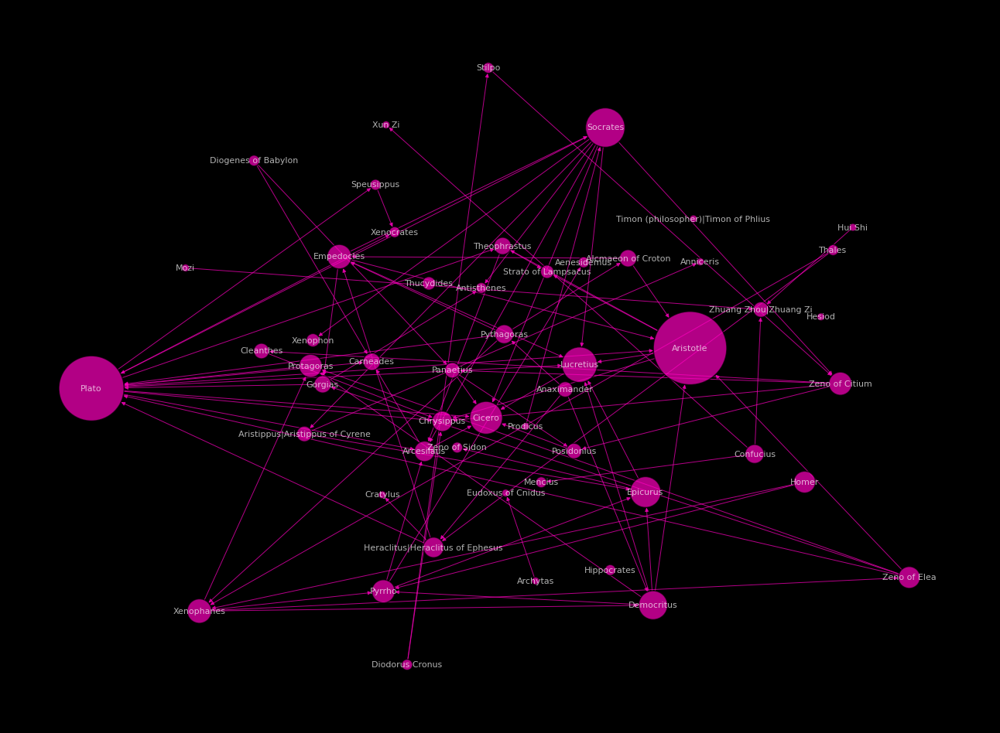

1.: 0-500
Name: 
Type: DiGraph
Number of nodes: 32
Number of edges: 18
Average in degree:   0.5625
Average out degree:   0.5625
                                  0  1
2                          Plotinus  6
26  Pseudo-Dionysius the Areopagite  4
19                          Proclus  4
23               Seneca the Younger  3
0                   Ammonius Saccas  2
20                  Marcus Aurelius  2
10                       Tertullian  2
1                        Parmenides  2
15               Augustine of Hippo  1
30            Clement of Alexandria  1


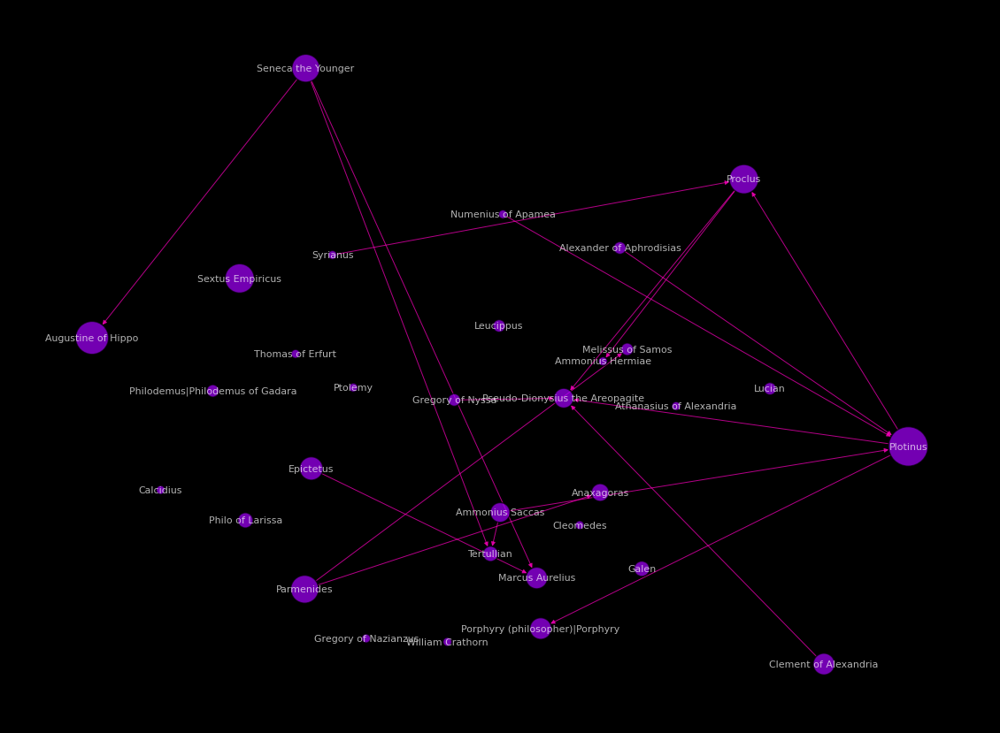

2.: 500-1000
Name: 
Type: DiGraph
Number of nodes: 7
Number of edges: 2
Average in degree:   0.2857
Average out degree:   0.2857
                  0  1
5         Al-Farabi  2
0          Al-Kindi  1
1     Yahya ibn Adi  1
2         Damascius  0
3  John of Damascus  0
4       Saadia Gaon  0
6   John Philoponus  0


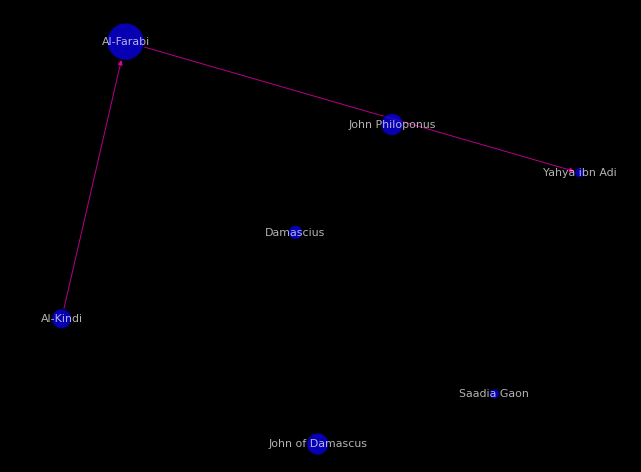

3.: 1000-1500
Name: 
Type: DiGraph
Number of nodes: 65
Number of edges: 93
Average in degree:   1.4308
Average out degree:   1.4308
                              0   1
60                     Averroes  14
13            William of Ockham  12
50               Thomas Aquinas  12
23                     Avicenna  10
55             Nicholas of Cusa   8
52              Albertus Magnus   7
49  Anselm of Canterbury|Anselm   7
34                  Duns Scotus   7
20                Giles of Rome   6
17               Paul of Venice   6


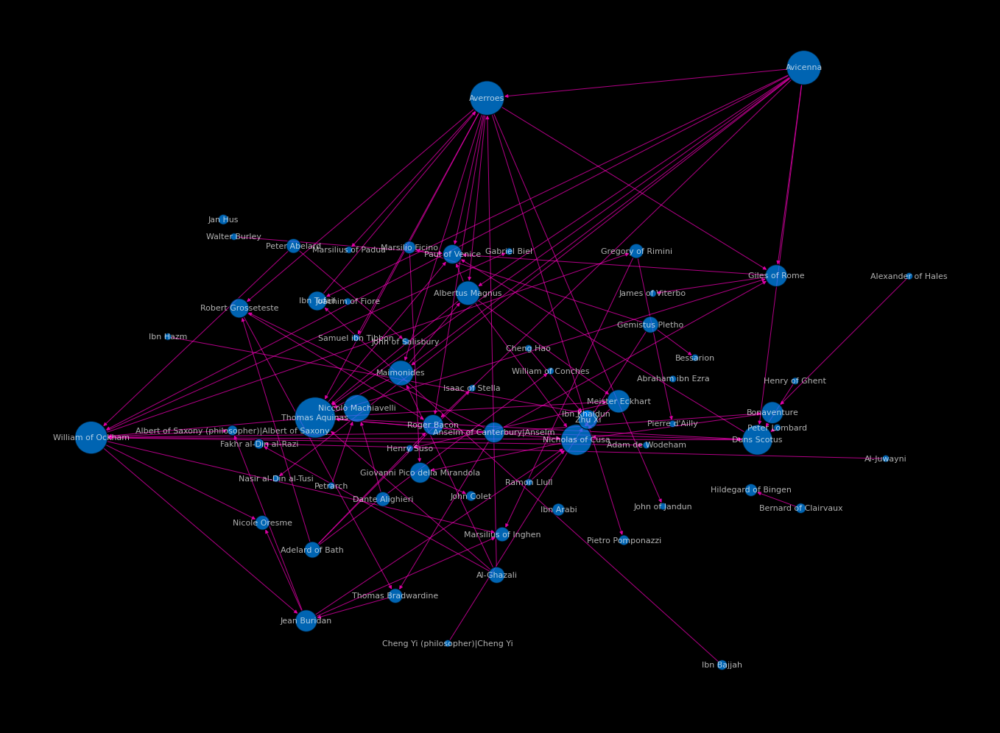

4.: 1500-1600
Name: 
Type: DiGraph
Number of nodes: 26
Number of edges: 7
Average in degree:   0.2692
Average out degree:   0.2692
                      0  1
0            Paracelsus  2
22        Francis Bacon  2
9   Michel de Montaigne  2
20       Pierre Charron  2
2        Justus Lipsius  1
3        Giordano Bruno  1
24          Jakob Böhme  1
23         Petrus Ramus  1
6            Jean Bodin  1
19  Nicolaus Copernicus  1


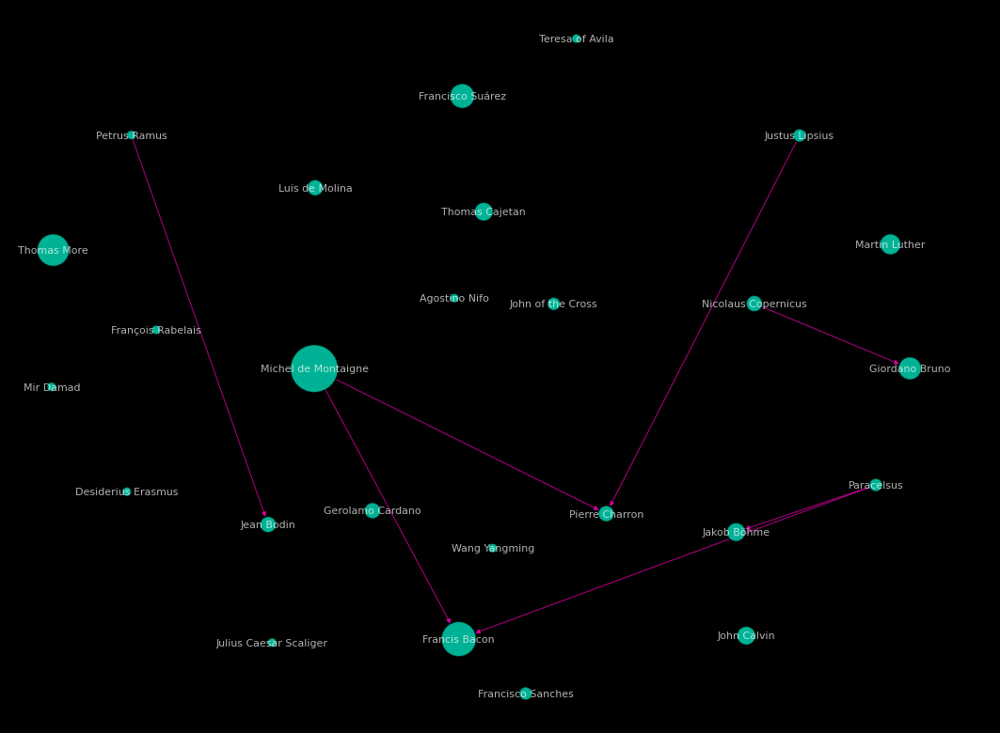

5.: 1600-1700
Name: 
Type: DiGraph
Number of nodes: 41
Number of edges: 35
Average in degree:   0.8537
Average out degree:   0.8537
                     0   1
17      René Descartes  10
37        Hugo Grotius   7
3           John Locke   5
8        Thomas Hobbes   5
0      Pierre Gassendi   4
27     Antoine Arnauld   4
12      Baruch Spinoza   3
39  Christiaan Huygens   3
38        Isaac Newton   3
35      Marin Mersenne   3


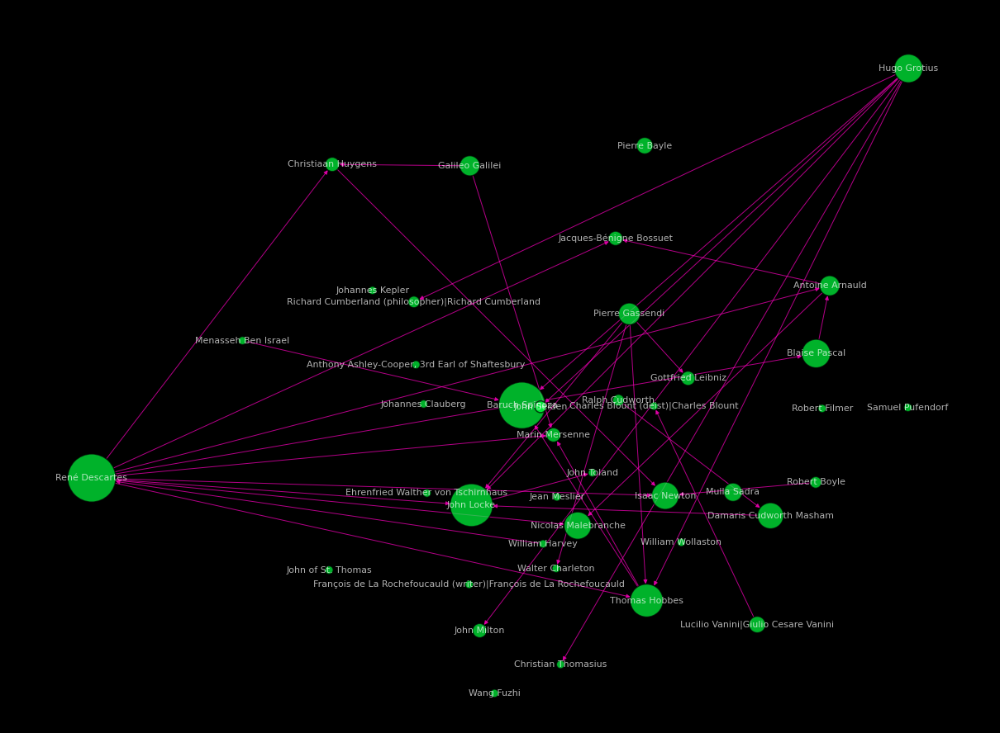

6.: 1700-1800
Name: 
Type: DiGraph
Number of nodes: 68
Number of edges: 72
Average in degree:   1.0588
Average out degree:   1.0588
                                                0   1
50  Christian Wolff (philosopher)|Christian Wolff  10
20                                  Immanuel Kant  10
57                                     David Hume   9
18                                  Joseph Butler   8
41                                       Voltaire   7
8                                    Thomas Paine   7
16                                 Jeremy Bentham   5
1                                      Adam Smith   5
14                                   Edmund Burke   5
67                      Friedrich Heinrich Jacobi   4


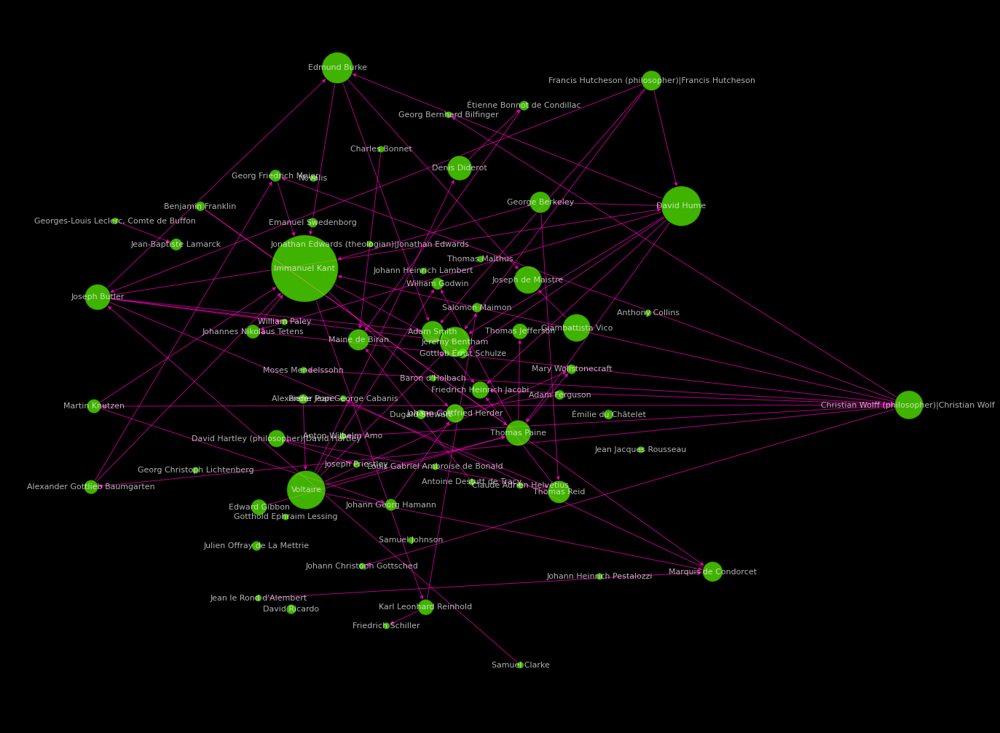

7.: 1800-1900
Name: 
Type: DiGraph
Number of nodes: 167
Number of edges: 250
Average in degree:   1.4970
Average out degree:   1.4970
                       0   1
54         William James  18
70             Karl Marx  17
121       Charles Darwin  17
25      John Stuart Mill  16
47         Auguste Comte  14
127            Max Weber  14
61         Hermann Lotze  12
102      Herbert Spencer  12
73        Edmund Husserl  11
8    Friedrich Nietzsche  11


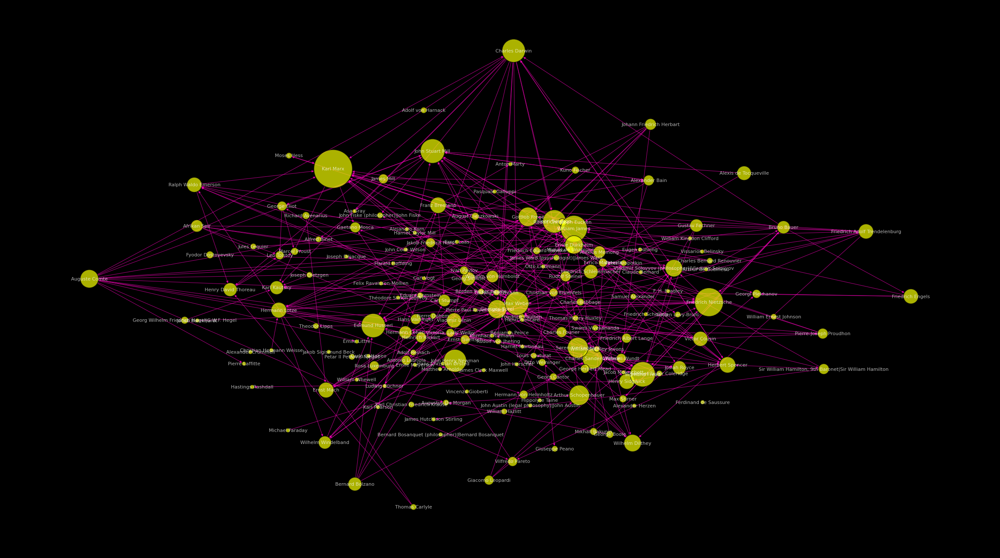

8.: 1900-1950
Name: 
Type: DiGraph
Number of nodes: 182
Number of edges: 170
Average in degree:   0.9341
Average out degree:   0.9341
                       0   1
29   Ludwig Wittgenstein  14
110     Martin Heidegger  11
34      Bertrand Russell  10
24           G. E. Moore   8
79        Moritz Schlick   8
55           Max Scheler   8
89          Martin Buber   7
72       Benedetto Croce   6
159          Leo Strauss   6
176         Carl Schmitt   6


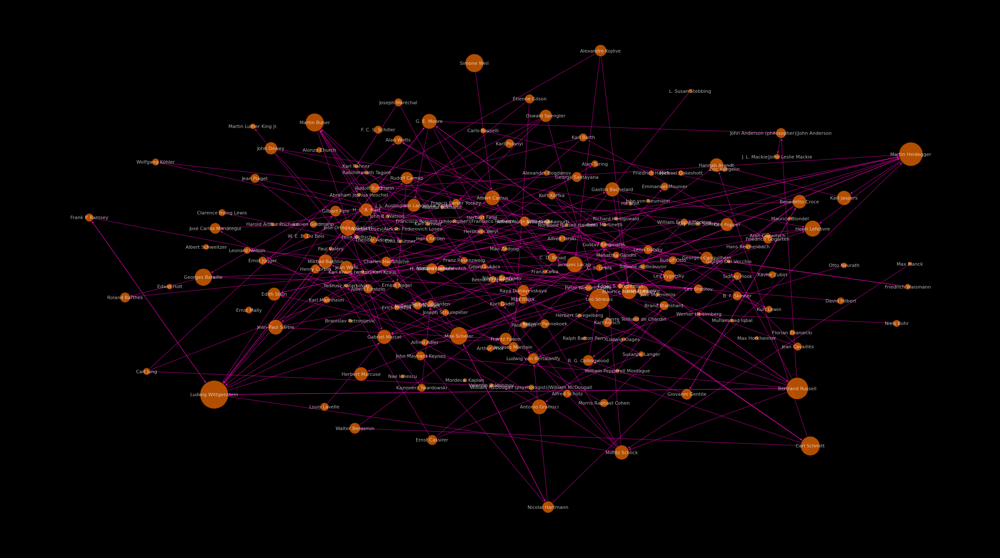

9.: 1950-2000
Name: 
Type: DiGraph
Number of nodes: 192
Number of edges: 233
Average in degree:   1.2135
Average out degree:   1.2135
                                                 0   1
131                                  Hilary Putnam  14
105                                Jacques Derrida  14
66                           Cornelius Castoriadis  13
135                                Michel Foucault  13
189                                Louis Althusser  12
176                              G. E. M. Anscombe  11
0                                   Nelson Goodman  11
49                                    Derek Parfit  10
109  Donald Davidson (philosopher)|Donald Davidson   9
182                                    Saul Kripke   8


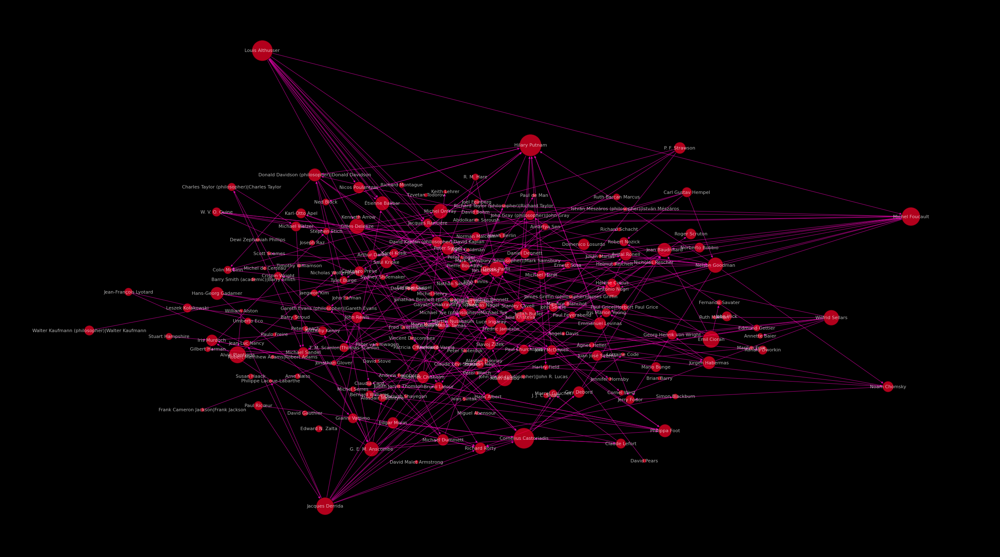

In [30]:
# Force Atlas-version
# For each historic period

data = data.sort_values('Names')

netEdge = []
netNode = []
netAvgK = []
netProb = []


for i,the_period in zip(range(len(MmName)), MmName):

    Q = G.subgraph(data[data['HistoricGroup'] == i]['Names'].values)
    print(str(i)+'.: '+the_period)
    print(nx.info(Q))
    kQ = pd.DataFrame(Q.degree).sort_values(1, ascending=False)
    print(kQ[:10])

    netEdge.append(len(Q.edges))
    netNode.append(len(Q.nodes))
    netAvgK.append(np.mean(kQ[1].values))
    netProb.append(np.mean(kQ[1].values)/(len(Q.nodes)-1))

    forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        edgeWeightInfluence=0.5,
                        # Performance
                        jitterTolerance=0.01, # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.6,
                        # Tuning
                        scalingRatio=400,
                        strongGravityMode=False,
                        gravity=0,
                        # Log
                        verbose=False)
    
    positions = forceatlas2.forceatlas2_networkx_layout(Q, pos=None, iterations=50)

    extra_space = 1
    if i in [7,8,9]:
        extra_space = 1.4
    fig, ax = plt.subplots(figsize=(4*np.log2(len(Q.nodes))*extra_space,3*np.log2(len(Q.nodes)*extra_space)))
    nx.draw(Q, positions,
            nodelist=list(data[data['HistoricGroup'] == i]['Names'].values),
            node_color=data[data['HistoricGroup'] == i]['ColorsHistoric'].values,
            node_size=data[data['HistoricGroup'] == i]['NodeSize'].values,
            linewidths=1.5,
            edgecolors='black',
            edge_color=edge_colorlist,
            alpha=0.7,
            with_labels=True, font_size=11, font_color='#FFFFFF')#656464
    ax.set_facecolor('black')
    ax.axis('off')
    fig.set_facecolor('black')
    #plt.savefig("SubNetworks/Subgraph"+str(i)+'_'+the_period+".png", format="PNG")
    plt.show()
    


In [31]:
data['Community'].max()

13

Community.: 1/13
Name: 
Type: DiGraph
Number of nodes: 151
Number of edges: 378
Average in degree:   2.5033
Average out degree:   2.5033
                     0   1
83           Aristotle  50
93               Plato  32
107     Thomas Aquinas  23
57      René Descartes  21
116           Averroes  20
15            Avicenna  19
45   William of Ockham  18
95            Voltaire  16
147   Nicholas of Cusa  16
42            Plotinus  15


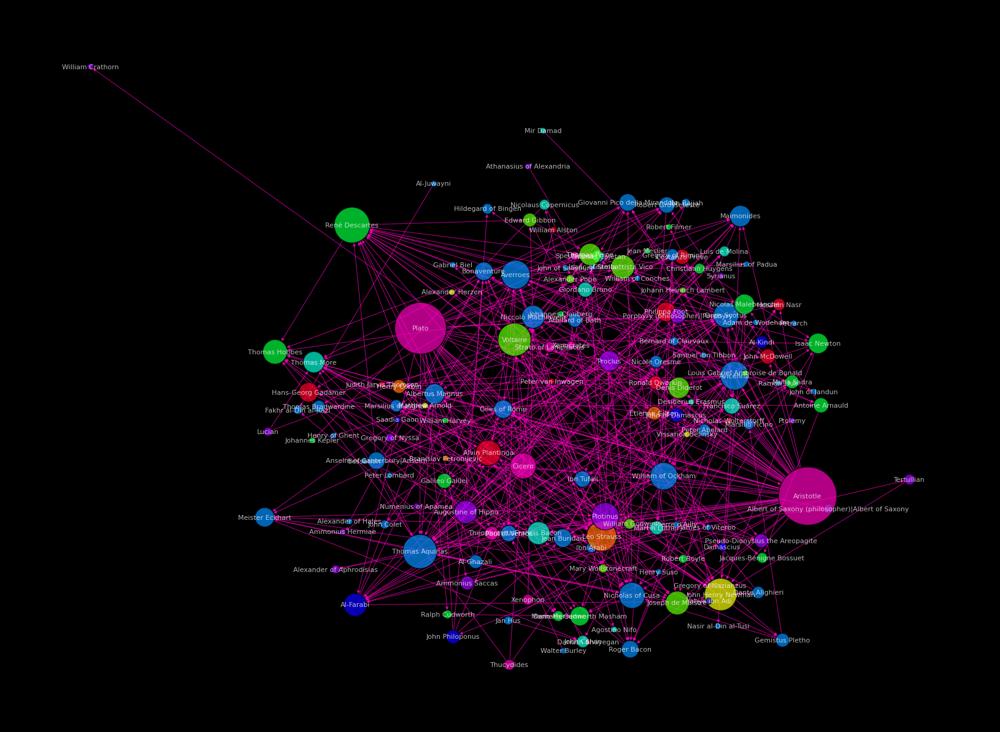

Community.: 2/13
Name: 
Type: DiGraph
Number of nodes: 140
Number of edges: 349
Average in degree:   2.4929
Average out degree:   2.4929
                         0   1
69               Karl Marx  49
139        Louis Althusser  23
48   Cornelius Castoriadis  18
94         Michel Foucault  17
75         Jacques Derrida  16
138          Sigmund Freud  16
132        Antonio Gramsci  13
5         Georges Bataille  13
13          Henri Lefebvre  13
62         Étienne Balibar  12


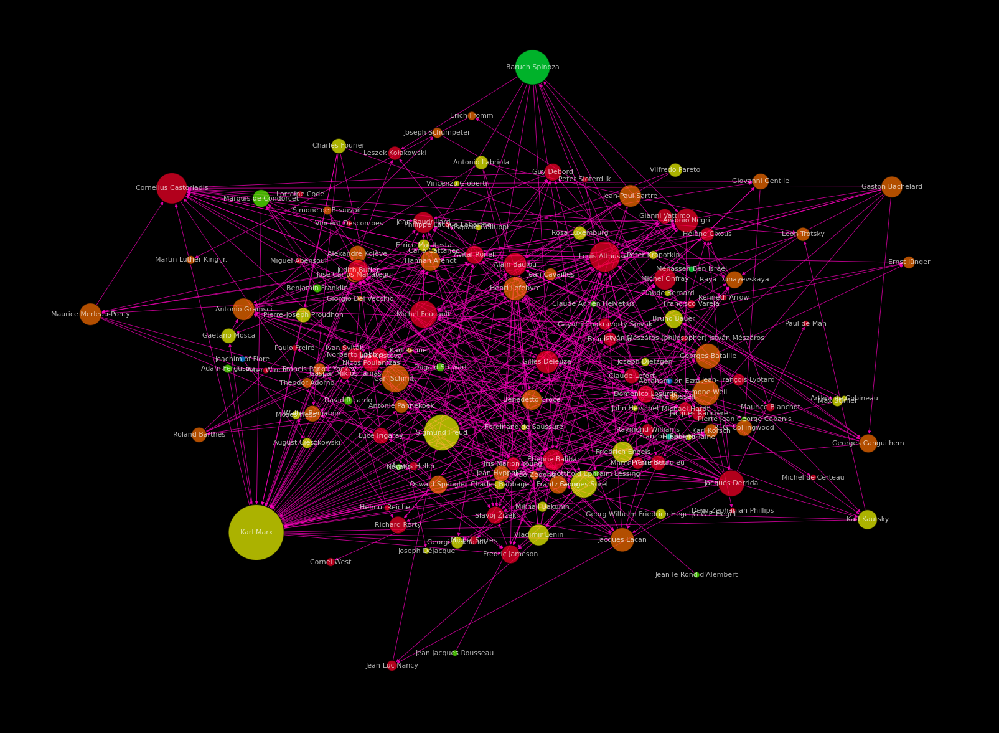

Community.: 3/13
Name: 
Type: DiGraph
Number of nodes: 142
Number of edges: 287
Average in degree:   2.0211
Average out degree:   2.0211
                        0   1
9           Immanuel Kant  41
64         Edmund Husserl  20
4     Friedrich Nietzsche  18
88       Martin Heidegger  16
113             Max Weber  14
69           Martin Buber  14
48        Wilhelm Dilthey  14
41            Max Scheler  13
141  José Ortega y Gasset  12
56            Emil Cioran  12


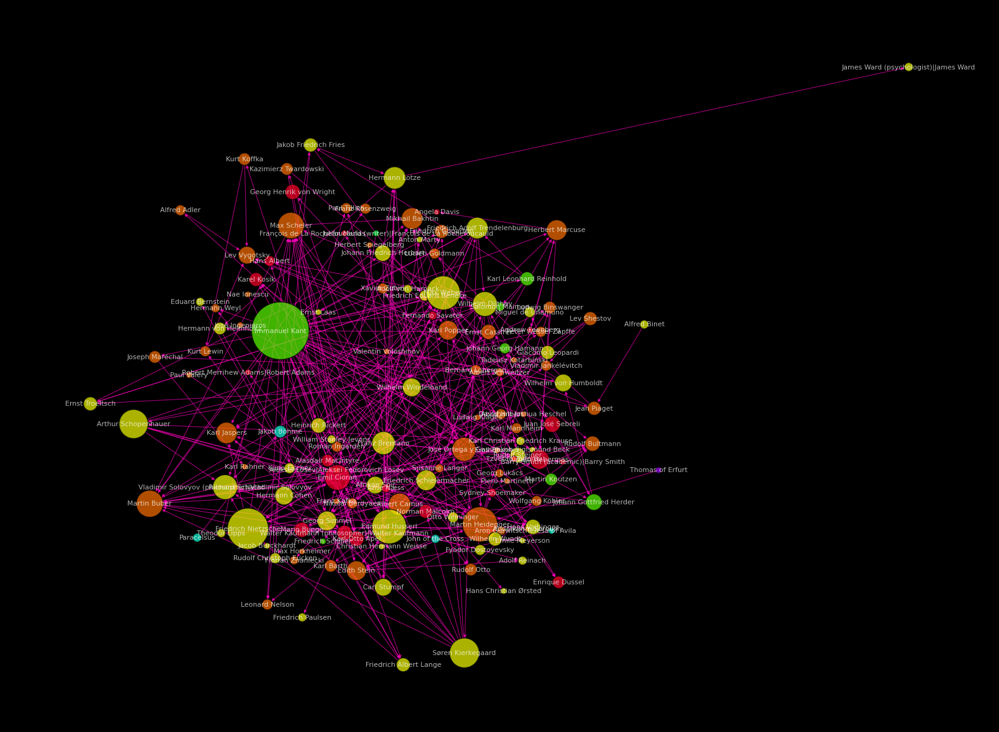

Community.: 4/13
Name: 
Type: DiGraph
Number of nodes: 60
Number of edges: 113
Average in degree:   1.8833
Average out degree:   1.8833
                      0   1
31             Socrates  11
13           Xenophanes   9
37               Pyrrho   9
22           Democritus   9
19       Zeno of Citium   9
2            Parmenides   8
25             Epicurus   8
43     Sextus Empiricus   7
53            Lucretius   7
18  Michel de Montaigne   7


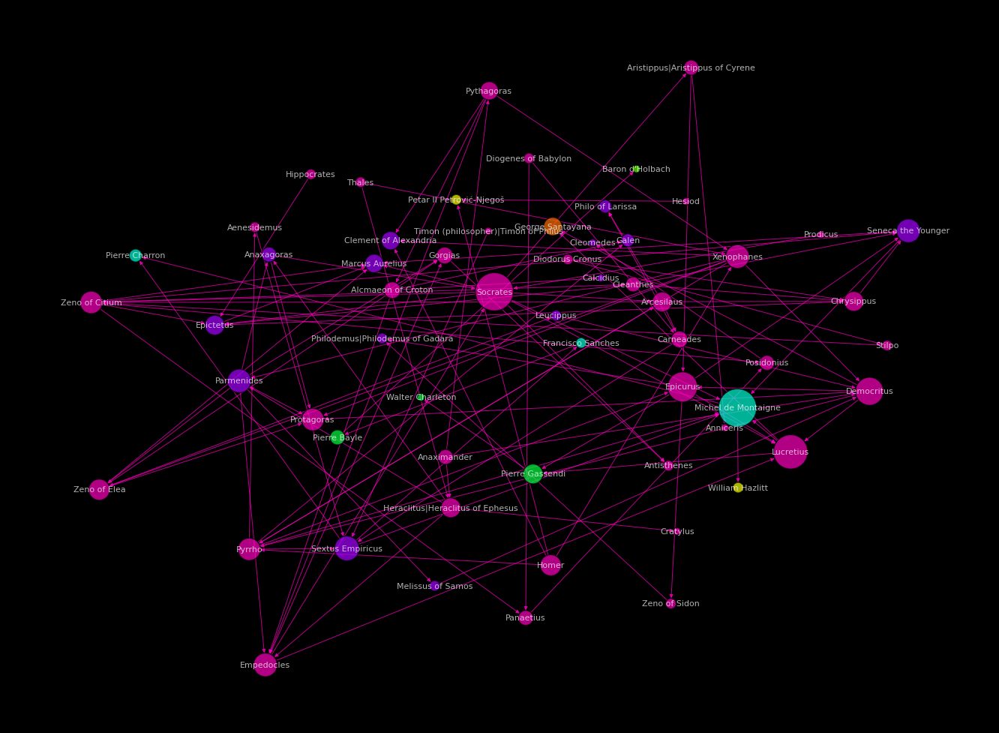

Community.: 5/13
Name: 
Type: DiGraph
Number of nodes: 85
Number of edges: 131
Average in degree:   1.5412
Average out degree:   1.5412
                      0   1
31        William James  22
60        Henri Bergson  14
65       Charles Darwin  13
83       Émile Durkheim   9
10           Ernst Mach   9
2          Josiah Royce   7
55      Herbert Spencer   7
26        Auguste Comte   7
24  Henry David Thoreau   7
64       Gabriel Marcel   7


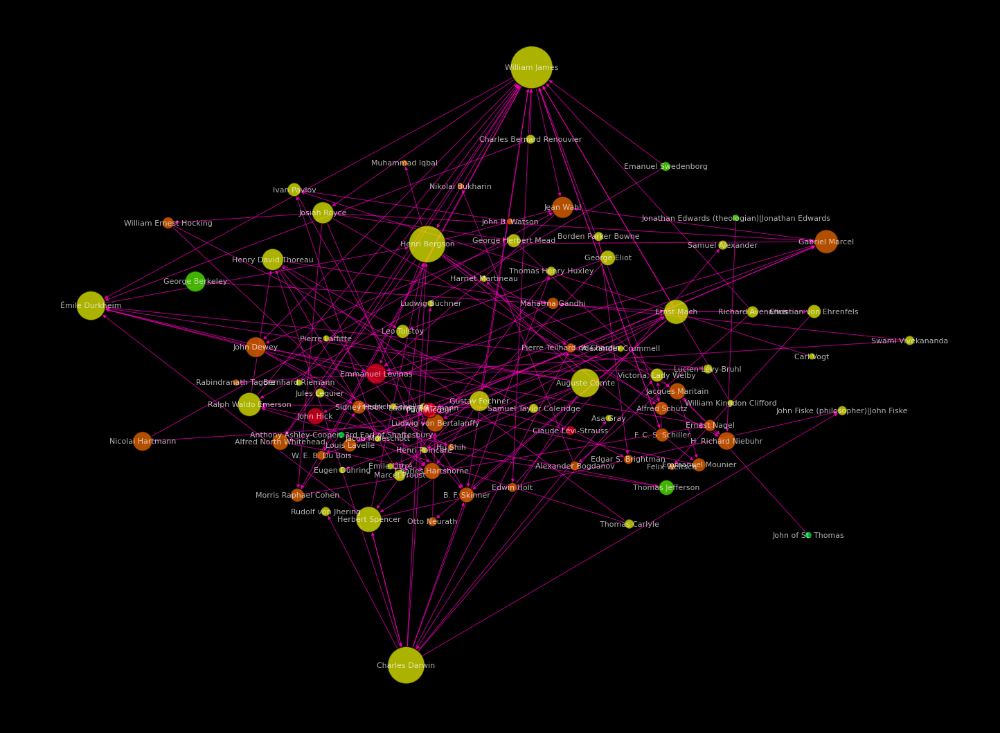

Community.: 6/13
Name: 
Type: DiGraph
Number of nodes: 117
Number of edges: 214
Average in degree:   1.8291
Average out degree:   1.8291
                          0   1
18      Ludwig Wittgenstein  29
21         Bertrand Russell  17
68            Hilary Putnam  16
100           Gottlob Frege  14
0            Nelson Goodman  13
115              David Hume  11
15              G. E. Moore  10
9           Wilfrid Sellars   9
90   Charles Sanders Peirce   9
106             Saul Kripke   8


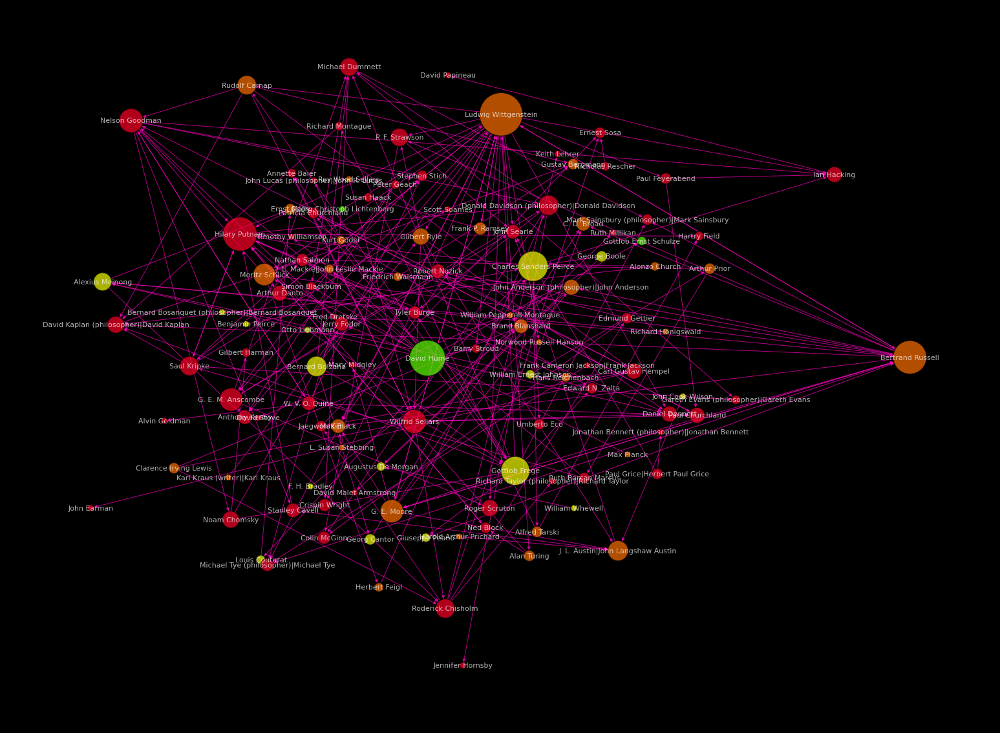

Community.: 7/13
Name: 
Type: DiGraph
Number of nodes: 84
Number of edges: 128
Average in degree:   1.5238
Average out degree:   1.5238
                   0   1
14  John Stuart Mill  15
5         John Locke  12
20      Derek Parfit  11
7     Jeremy Bentham  11
81     Joseph Butler   9
37    Henry Sidgwick   9
66      Edmund Burke   8
39      Hugo Grotius   8
41        Adam Smith   7
74      Peter Singer   7


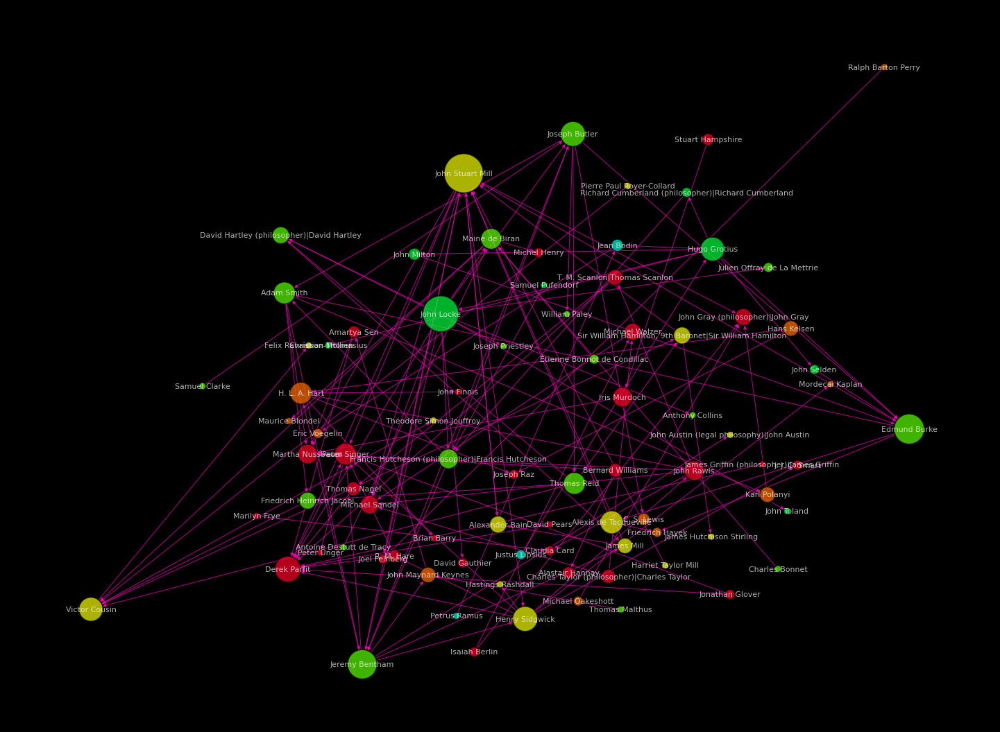

Community.: 8/13
Name: 
Type: DiGraph
Number of nodes: 2
Number of edges: 1
Average in degree:   0.5000
Average out degree:   0.5000
                   0  1
0  Eudoxus of Cnidus  1
1           Archytas  1


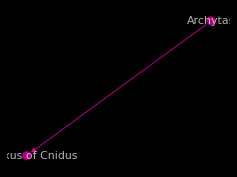

Community.: 9/13
Name: 
Type: DiGraph
Number of nodes: 12
Number of edges: 11
Average in degree:   0.9167
Average out degree:   0.9167
                                        0  1
10    Lucilio Vanini|Giulio Cesare Vanini  4
2                              Niels Bohr  3
6                           Blaise Pascal  3
9                             Edgar Morin  3
0                        Gerolamo Cardano  2
1                         Harald Høffding  1
3                            Pierre Duhem  1
4   Charles Blount (deist)|Charles Blount  1
5                  Julius Caesar Scaliger  1
7                       Pietro Pomponazzi  1


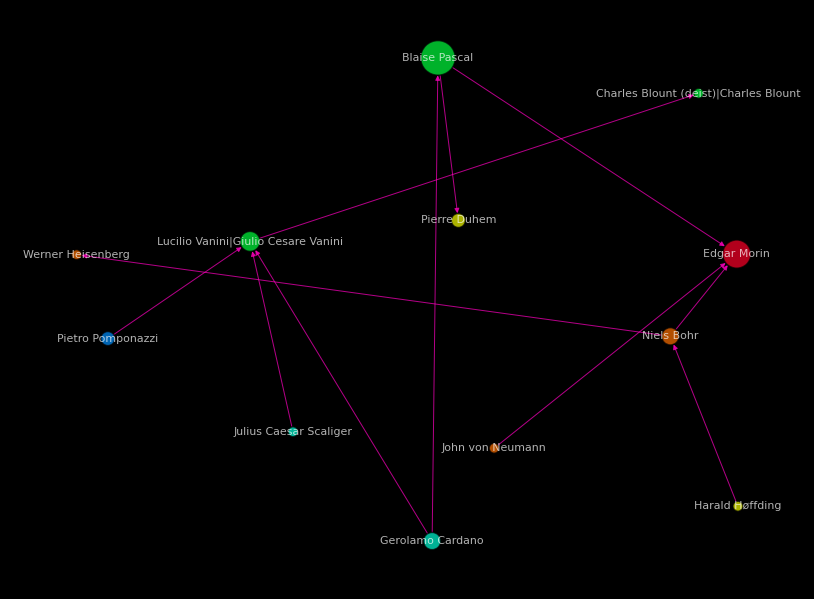

Community.: 10/13
Name: 
Type: DiGraph
Number of nodes: 32
Number of edges: 34
Average in degree:   1.0625
Average out degree:   1.0625
                                                    0  1
21      Christian Wolff (philosopher)|Christian Wolff  9
22                                          Confucius  6
17                                             Zhu Xi  6
1                                          Alan Watts  4
24                              Zhuang Zhou|Zhuang Zi  4
28                      Alexander Gottlieb Baumgarten  3
7                                     Albert Einstein  3
0   William McDougall (psychologist)|William McDou...  2
25                              Georg Friedrich Meier  2
23                              Jean-Baptiste Lamarck  2


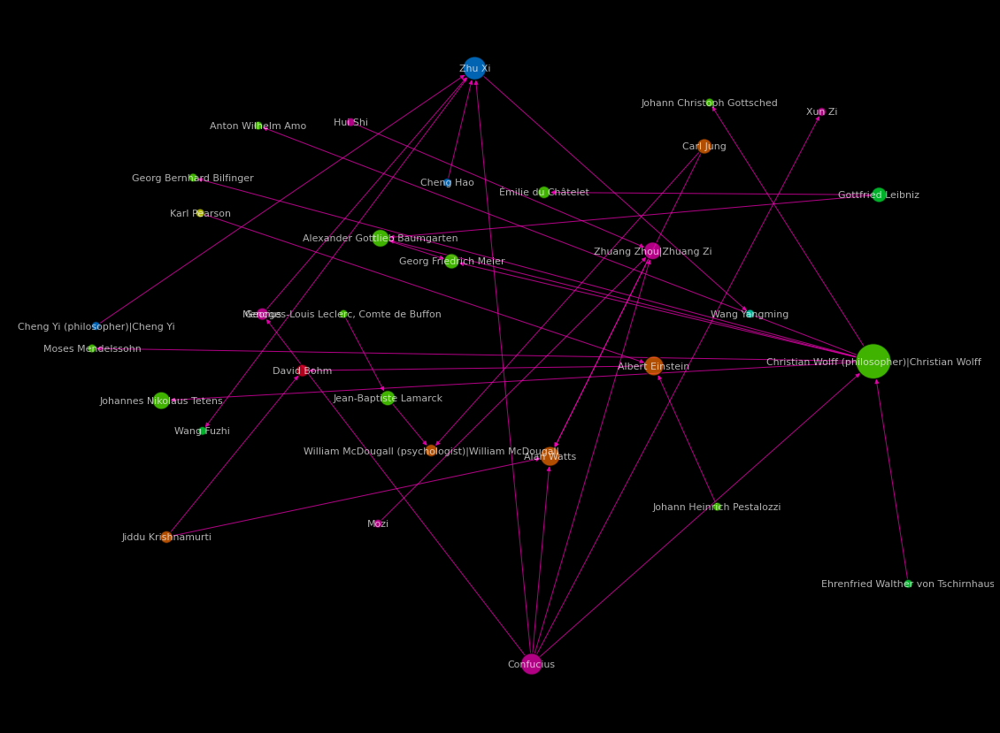

Community.: 11/13
Name: 
Type: DiGraph
Number of nodes: 2
Number of edges: 1
Average in degree:   0.5000
Average out degree:   0.5000
             0  1
0     Ibn Hazm  1
1  Ibn Khaldun  1


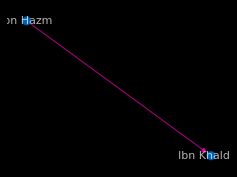

Community.: 12/13
Name: 
Type: DiGraph
Number of nodes: 2
Number of edges: 1
Average in degree:   0.5000
Average out degree:   0.5000
                                                 0  1
0  Francisco Romero (philosopher)|Francisco Romero  1
1                                   Alejandro Korn  1


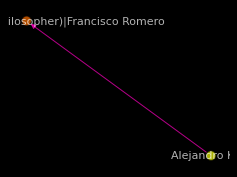

Community.: 13/13
Name: 
Type: DiGraph
Number of nodes: 2
Number of edges: 1
Average in degree:   0.5000
Average out degree:   0.5000
                     0  1
0      Michael Faraday  1
1  James Clerk Maxwell  1


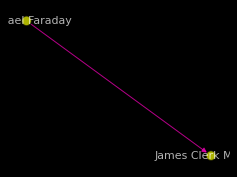

In [32]:
# Force Atlas-version
# For the communities

data = data.sort_values('Names')

netEdgeComm = []
netNodeComm = []
netAvgKComm = []
netProbComm = []


for i in range(data['Community'].max()):

    Q = G.subgraph(data[data['Community'] == i]['Names'].values)
    print('Community.: '+str(i+1)+'/'+str(data['Community'].max()))
    print(nx.info(Q))
    kQ = pd.DataFrame(Q.degree)
    kQ = kQ.sort_values(1, ascending=False)
    print(kQ[:10])

    netEdgeComm.append(len(Q.edges))
    netNodeComm.append(len(Q.nodes))
    netAvgKComm.append(np.mean(kQ[1].values))
    netProbComm.append(np.mean(kQ[1].values)/(len(Q.nodes)-1))

    forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        edgeWeightInfluence=0.5,
                        # Performance
                        jitterTolerance=0.01, # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.6,
                        # Tuning
                        scalingRatio=400,
                        strongGravityMode=False,
                        gravity=0,
                        # Log
                        verbose=False)
    
    positions = forceatlas2.forceatlas2_networkx_layout(Q, pos=None, iterations=5)
    
    extra_space = 1
    #if i in [7,8,9]:
    #    extra_space = 1.4
    
    fig, ax = plt.subplots(figsize=(4*np.log2(len(Q.nodes))*extra_space,3*np.log2(len(Q.nodes)*extra_space)))
    nx.draw(Q, positions,
            nodelist=list(data[data['Community'] == i]['Names'].values),
            node_color=data[data['Community'] == i]['ColorsHistoric'].values,
            node_size=data[data['Community'] == i]['NodeSize'].values,
            linewidths=1.5,
            edgecolors='black',
            edge_color=edge_colorlist,
            alpha=0.7,
            with_labels=True, font_size=11, font_color='#FFFFFF')#656464
    ax.set_facecolor('black')
    ax.axis('off')
    fig.set_facecolor('black')
    plt.savefig("SubNetworks/SubgraphCommunity_"+str(i+1).zfill(2)+".png", format="PNG")
    plt.show()

    


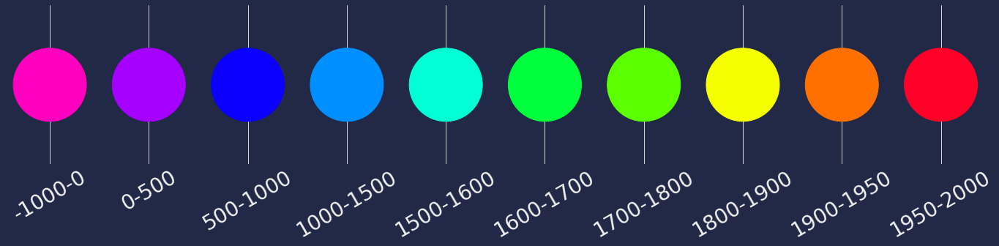

In [33]:
# Making the color legend of the history
HistoricColors = []

for i in range(10):
    HistoricColors.append(data['ColorsHistoric'][data['HistoricGroup'] == i].values[0])

xc = np.arange(10)
yc = np.ones(10)

fig, ax = plt.subplots(figsize=(24,4))
ax.scatter(xc, yc, s=[10000 for i in range(10)], color=HistoricColors);
ax.set_xticks(np.arange(10))
ax.set_xticklabels(MmName,fontsize=28, rotation=30)
ax.get_yaxis().set_visible(False)

#plt.savefig('color_legend.png', format='PNG')
plt.show()

Some properties of the subgraphs are calculated:

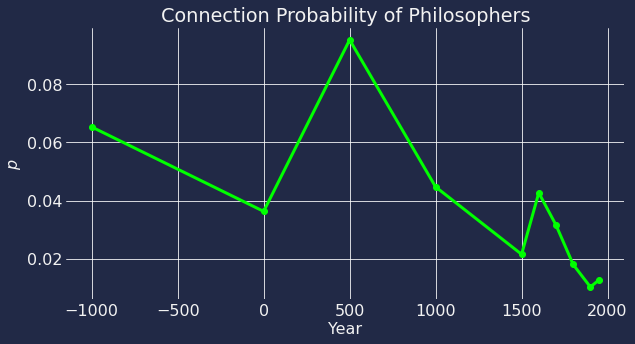

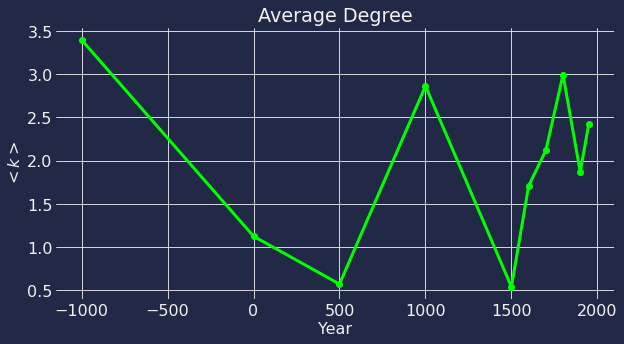

In [34]:
# Properties of the subgraphs
netEdge
netNode
netAvgK
netProb
X = [-1000, 0, 500, 1000, 1500, 1600, 1700, 1800, 1900, 1950]

plt.figure()
plt.plot(X, netProb,'-o')
plt.title('Connection Probability of Philosophers')
plt.ylabel('$p$')
plt.xlabel('Year')
plt.savefig('connected_p'+".png", format="PNG")
plt.show()


plt.figure()
plt.plot(X, netAvgK,'-o')
plt.title('Average Degree')
plt.ylabel('$<k>$')
plt.xlabel('Year')
plt.savefig('avg_k'+".png", format="PNG")
plt.show()


#### Wordcloud-visualization

The goal of the wordclouds in this report is to give a visual representation of the keywords of the most significant currents of philosophy from 1000 BC until 2000 AD.

First step for generating the wordclouds was downloading the wikipages. After that, two functions were created: one that finds the paths of the downloaded wikitexts and one that reads and saves them. After running those functions, 1 long list of 10 arrays is created. Each array contains the downloaded text of the philosophical representatives that belong in the same period.

Next step was cleaning of the wikitexts. The texts of wikipedia include a lot of information that gives a great insight in each philosophical period, but also a lot of noise. In order to clean the text a function that takes as an input a list and returns a string was created. This function :

1. Removes every word in brackets, using the RegEx module.

2. Only keeps words that have length larger than 3 characters. This way, many words like ref and single characters are removed form the text.

3. Tokenizes the words. The tokenizer function of nltk module returns the input text splitted in strings. Those substrings correspond to tokens. There are five types of tokens : keywords ( eg :for, del, elif, else ), punctuators, identifiers (names that identify the variables, functions etc.), operators (symbols that carry mathematical or logical computations), delimiters(sequences used to specify boundaries between separate regions) , and literals.(visible way to write a value,eg : integers, floating numbers, booleans etc).

4. Removes all punctuation tokens.

5. Removes empty substrings that are left in the places of punctuation.

6. Lemmatizes every word. A lemmatizer converts a word to its original meaningful form.

7. Removes stopwords.

8. At this point a dictionary is created where the values are the words and keys are the number of times each of them appears.

9. In this dictionary , even after the cleaning there are some words that do not help the reader gain any insight in the philosophical period ( philosophy, write, man, name, year etc). The function also removes those words from the dictionary.

10. The final output of the function is a string where each word is repeated as many times as its corresponding key in the dictionary. 




In [35]:
!pip install wordcloud

You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.


In [36]:
pip install nltk

You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [37]:
# Import all necessary libraries

import math
import re
import os
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
import string
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

[nltk_data] Downloading package punkt to /home/jovyan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/jovyan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [38]:
# Functions

# Get the paths.

def get_paths(group):
    parent_folder=r"./pageContent"
    #subfolders = os.listdir(parent_folder)
    paths=['DUMMY']*len(group)
    i=0
    for philosopher in group:
        in_file = (parent_folder+'/'+ philosopher+'')
        paths[i]=parent_folder+'/'+ philosopher+'_pageContent'
        i=i+1
    return paths



# Create function that reads and saves the texts.

def get_group_text(paths):
    text_group=['DUMMY']*len(paths)
    i=0
    for path in paths:
        f=open(str(path),encoding="utf8")
        raw = f.read().splitlines()
        text_group[i]=raw
        i=i+1
    return text_group


# Clean the texts in order to have meaningful words in the wordclouds.

def preprocess_text(list):
    
    # Remove words into brackets.
    Text_Str1=re.sub("[\(\[].*?[\)\]]", "", str(list)) 

    # Keep all words that have length more than 3 characters
    Text_Str = ' '.join([w for w in Text_Str1.split() if len(w)>3])

    #Tokenize the words.
    tokens= nltk.word_tokenize(Text_Str)

    # Remove punctuation.
    text_ = [''.join(c for c in t if c not in string.punctuation) for t in tokens] 

    # Remove empty strings that are left in the places of punctuation.
    text_ = ' '.join(text_).split() 
    
    # Turn every word to lowercase.
    text_=[y.lower() for y in text_] 
    text_

    # Lemmatize words.
    wnl= WordNetLemmatizer() 
    l_text = [wnl.lemmatize(word) for word in text_] 
    l_text

    # Remove stopwords.
    stop_words = set(stopwords.words('english'))
    filtered_text = [w for w in l_text if not w in stop_words]
    #filtered_text

    # Find the term frequency.
    freq_text= nltk.FreqDist(filtered_text)
    freq_text

    # Remove words from dictionary freq_text that do not give any information
    entities_to_remove = ('ref', 'cite','name' ,'book','philosopher','titlethe',\
    'wa','ha','br','also','name','pp','one','three','work',\
    'many','made','urlhttps','isbn','der','would','year','title','booksgooglecombooks','und','used',\
    'de','le','http','nbsp','p','url','j','vol','link','philosophy','war','will','work',\
    'university','theory','upon','wrote','even','among','however','text','citation',\
    'blockquote','booksgooglebooks','first','date','edition','press','journal','time','isbn',\
    'published','publisher','urlhttp','last''writing','volume','early','called','page','small'\
    ,'late','considered','became','later','sfn','others','see','probably','mean','based','said','translated',\
    'century','part','without','webarchiveurlhttps','good','rather','either','though','writte','according',\
    'thing','form','note','reading','philosopher','second','began','member','last','others','philosopher','philosophical'\
    ,'view','known','study','weburlhttp', 'textalign')
    for x in entities_to_remove:
        if x in freq_text:
            del freq_text[x]
    
    #Sort by value
    dict_Sorted = {k: v for k, v in sorted(freq_text.items(), key = lambda item: item[1], reverse = True)}

    #Create the  string that goes as an input to create the wordcloud
    
    Words = [w +' ' for (w,s) in dict_Sorted.items() for i in range(math.ceil(s))]
    Final_Str = ''.join(Words)
    return Final_Str

# Create the wordclouds

def generate_wc(sometext):
    #mask_phil= np.array(Image.open(r"/home/jovyan/work/thinking_man.png"))
    wc = WordCloud(collocations=False,background_color="black",width=1000,height=1000, max_words=200,relative_scaling=0.5).generate(sometext)


    plt.figure(figsize=(10,11))
    plt.imshow(wc,interpolation='bilinear', aspect='auto') 
    plt.axis("off")
    plt.show()

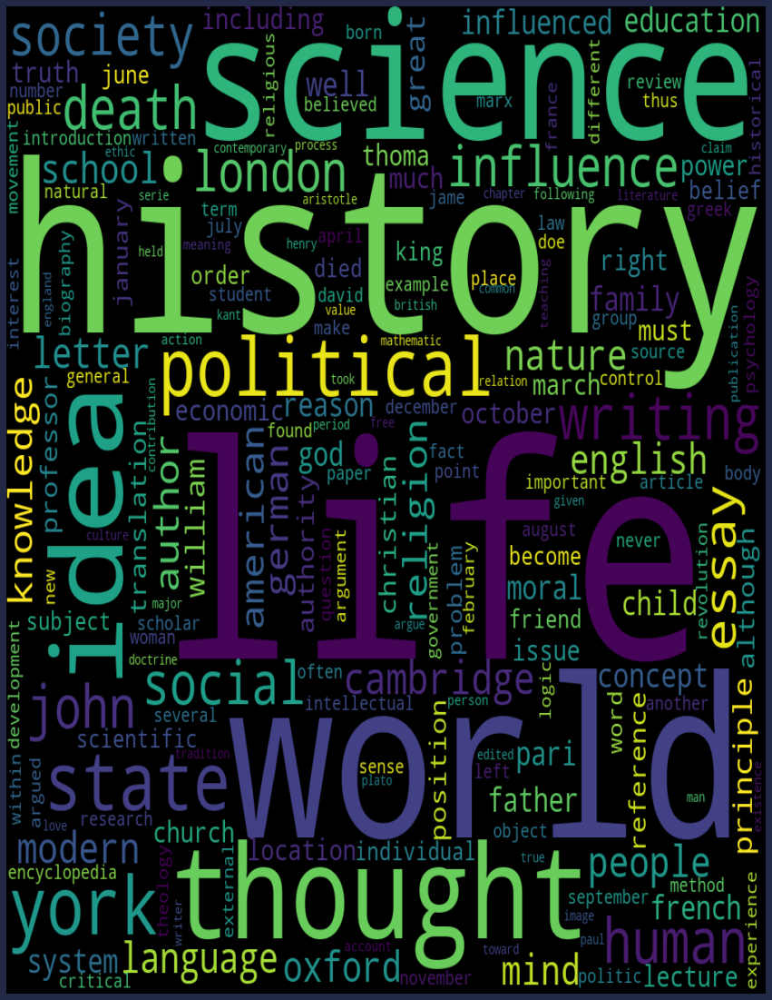

In [39]:
# Wordcloud for all wikitexts.

# Create a list of the paths of all wikipages.

parent_folder=r"./pageContent"
subfolders = os.listdir(parent_folder)

paths=['DUMMY']*len(subfolders)
i=0
for subfolder in subfolders:
    in_file = (parent_folder+'/'+ subfolder+'')
    paths[i]=parent_folder+'/'+ subfolder
    i=i+1

#Create a for loop that opens and reads the text of every path in the lists creted above.

text=['DUMMY']*len(paths)
i=0
for path in paths:
    f=open(str(path),encoding="utf8")
    raw = f.read().splitlines()
    text[i]=raw
    i=i+1

final_str=preprocess_text(text)

plt.figure(figsize=(15,20))
#plt.title('Period:-500-2000', fontsize=40)
wc = WordCloud(collocations=False,background_color="black",width=1000,height=1000, max_words=200,relative_scaling=0.5).generate(final_str)
plt.imshow(wc,interpolation='bilinear', aspect='auto') 
plt.axis("off");
plt.show()


In [40]:
# Create wordclouds for each historic group.

# Definition of the groups

historic_groups=[0]*len(historicNamesList)
for i in range(len(historicNamesList)):
    historic_groups[i]=historicNamesList[i]


timesAndNamesTogether = zip(MmName, historic_groups)

for a_time_period, a_group_of_names in timesAndNamesTogether:

    group_paths1=get_paths(a_group_of_names)
    group_texts1=get_group_text(group_paths1)
    group_string1_fin=preprocess_text(group_texts1)

    # Fixing that the files have a white background (because that's how wordcloud wants it):
    mask_phil = Image.open(r"/home/jovyan/work/imagez/"+a_time_period+"c.png")
    mask_phil_new = Image.new("RGBA", mask_phil.size, "WHITE") # Create a white rgba background
    mask_phil_new.paste(mask_phil, (0, 0), mask_phil)              # Paste the image on the background. Go to the links given below for details.

    mask_phil = np.array(mask_phil_new)
    image_colors = ImageColorGenerator(mask_phil)

    backgroundcolor = 'black'

    wc = WordCloud(collocations=False,background_color=backgroundcolor,mask=mask_phil,width=1200,height=900, max_words=200,relative_scaling=0.5).generate(group_string1_fin)
    wc = wc.recolor(color_func=image_colors)
    plt.figure(figsize=(28,44))
    #plt.title('Historic Presence: '+a_time_period, fontsize=20)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    


FileNotFoundError: [Errno 2] No such file or directory: '/home/jovyan/work/imagez/-1000-0c.png'

In [ ]:
# Create a subplot for the 20 most important words of each historic period
# Subplot of the twenty most important words in year groups
# We chose not to include that in the website.

group_string_fin_cleaned=['dummy']*len(historic_groups)
for k in range(len(historic_groups)):
    print('Historic period:',MmName[k])
    group_paths=get_paths(historic_groups[k])
    group_texts=get_group_text(group_paths)
    group_string_fin_cleaned[k]=preprocess_text(group_texts)


titles_list=['-1000-0', '0-500', '500-1000', '1000-1500', '1500-1600', '1600-1700', '1700-1800', '1800-1900', '1900-1950', '1950-2000'] 

fig = plt.figure(figsize=(15,30))


#for k in range(len(historic_groups)):
 #   print('Historic period:',MmName[k])
  #  group_paths=get_paths(historic_groups[k])
   # group_texts=get_group_text(group_paths)


for j in range(len(historic_groups)):
    plt.subplot(5, 2 , j+1)
    
    #plt.title('Period:' +titles_list[j], fontsize=20)
    wc = WordCloud(collocations=False,background_color="black",width=1000,height=1000, max_words=20,relative_scaling=0.5).generate(group_string_fin_cleaned[j])
    plt.imshow(wc,interpolation='bilinear', aspect='auto') 
    plt.axis("off")

#plt.suptitle('Twenty most important words of each historic period.',fontsize=30, fontweight="bold")
plt.show()
#plt.savefig('Sublot.png',dpi=320)

#### Sentiment analysis


Sentiment analysis was performed based on the LabMT word list. The goal of this analysis is to investigate if there is any trend in the sentiment of the texts by posing two questions: Is philosophy becoming happier or sadder through the years? Is there a significant difference between the sentiment of the philosophers in detected communities of the network presented above? To answer these questions, a function that calculates sentiment given a list of tokens was created and applied to the texts of the wiki pages of the philosophers that belong in different historic groups and communities. The value of the sentiment varies from 1.3 (the minimum value of hapinnessDf column named happiness_average) to 8.1. (maximum value of the column happiness_average).  The value of the sentiment is proportional to the level of happiness of each text.

In [ ]:
philosopherSent = {}  # Dict for sentimal(value) for each character(key)

In [ ]:
# Load in necessary files and lists

happinessDf = pd.read_csv('happinessDataSet.csv',',')
wordList = happinessDf['word'].tolist()
happAvgList = happinessDf['happiness_average'].tolist()

In [ ]:
def sentCalc(philosopher, tokens):
    happList = []
    for t in tokens:
        if t in wordList: # If token is in data set of words
            indexWord = wordList.index(t) # find index of word 
            happList.append(happAvgList[indexWord]) # find happines score of token
    philosopherSent[philosopher] = np.average(happList) # Take average of all tokens sentiment value and save in dict
    

In [ ]:
def tokenizer(philosopherFile):
    text = philosopherFile.read() # Read content of file
    tokens = set(nltk.word_tokenize(text)) # make text into tokens, Unique tokens only
    tokens = [t.lower() for t in tokens] # lowercase all words 
    return tokens

In [ ]:
pathBase = "./pageContent/"
# Tokenize all philosopher pages and calculate the sentiment for each philosopher
for philosopher in data['Names']:
    pathFull = pathBase + philosopher + "_pageContent"
    if os.path.exists(pathFull):
        philosopherFile = open(pathFull, "r")
        tokens = tokenizer(philosopherFile)
        sentCalc(philosopher, tokens)
        #print(philosopher + " DONE")
    

In [ ]:
# Removes a key-value pair in a dictionary and returns as new dictionary
def removeDictPair(d, key):
    newDict = dict(d)
    del newDict[key]
    return newDict

# Get rid of philosophers with no sentiment value
for philosopher in philosopherSent:
    val = philosopherSent.get(philosopher)
    if str(val) == "nan":
        philosopherSent = removeDictPair(philosopherSent, philosopher)

In [ ]:
sentiDf = pd.DataFrame(philosopherSent, index=['Sentiment'])

plt.vlines(np.mean(sentiDf.T.values.flatten()), ymin=0, ymax=120, color='r', label="Philosophers' Mean");
plt.vlines(np.mean(happAvgList), ymin=0, ymax=120, color='b', label="General Mean");
#plt.vlines((max(happAvgList)-min(happAvgList))/2, ymin=0, ymax=120, color='b');
plt.hist(sentiDf.T.sort_values('Sentiment')['Sentiment'].values, bins=50, label="Sentiment");
plt.xlabel('Sentiment')
plt.title('Sentiment Distribution')
plt.ylabel('Number of Philosophers')
plt.legend()
plt.savefig("SentimentHist.png", format="PNG")



In [ ]:
# Finding happiest and saddest philosophers:
print('Saddest Philosophers:')
print(sentiDf.T.sort_values('Sentiment')[:10])
print()
print('Happiest Philosophers:')
print(sentiDf.T.sort_values('Sentiment', ascending=False)[:10])

In [ ]:
# Finds the average sentiment from a list of people
def groupSentFinder(groupList):
    tempSentGroup = []
    for philosopher in groupList: 
        if philosopher in philosopherSent: # If there exist a sentiment value for that specific person
            tempSent = philosopherSent.get(philosopher)
            tempSentGroup.append(tempSent)
    
    averageGroupSent = np.average(tempSentGroup) # Find average of the values in the list
    varianceGroupSent = np.var(tempSentGroup)
    return averageGroupSent, varianceGroupSent

In [ ]:
historicGroupsSent = []
historicGroupsSentStd = []

# Find average sentiment for all historic groups
for histList in historicNamesList:
    averageGroupSent, varianceGroupSent = groupSentFinder(histList)
    historicGroupsSent.append(averageGroupSent)
    historicGroupsSentStd.append(np.sqrt(varianceGroupSent))
    #print(averageGroupSent)

dSent = (max(historicGroupsSent)-min(historicGroupsSent))/min(historicGroupsSent) * 100
print('Max % change in sentiment')
print(dSent)

In [ ]:
# Finding the standard deviation of the of the sentiments:
historicGroupsSentStd

In [ ]:
X = [-1000, 0, 500, 1000, 1500, 1600, 1700, 1800, 1900, 1950]

fig, ax1 = plt.subplots(figsize=(10,6)) # from: https://matplotlib.org/gallery/api/two_scales.html

ax1.set_xlabel('Initial Year of the Period')
ax1.set_ylabel('Sentiment');
#ax1.plot(np.arange(len(X)), historicGroupsSent, label='Sentiment')
ax1.errorbar(np.arange(len(X)), historicGroupsSent, yerr=historicGroupsSentStd, label='Sentiment (w. errors)')
ax1.tick_params(axis='y')
ax1.set_yticks(np.linspace(5.3,5.8,11))

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('Number of nodes')  # we already handled the x-label with ax1
ax2.plot(np.arange(len(X)), netNode, color='r', label='Number of Nodes')
ax2.tick_params(axis='y')
ax2.grid(False)
ax2.set_yticks(np.linspace(0,200,11))

ax2.set_xticks(np.arange(len(X)))

ax1.set_xticklabels(X, rotation=45)

hs, ls = [(a + b) for a, b in zip(ax1.get_legend_handles_labels(), ax2.get_legend_handles_labels())]

fig.legend(hs, ls, loc=(0.1,0.8))

fig.tight_layout()  # otherwise the right y-label is slightly clipped
ax1.set_title('Evolution in Sentiment of Philosophers')
plt.savefig("SentimentPlot2.png", format="PNG")
plt.show()
print(np.arange(len(X)), historicGroupsSent)
print(np.arange(len(X)), netNode)

In [ ]:
communitySent = {}
# Find average sentiment for all communities
for communityNumber in range(0,15):
    communityNamesList = list(data.loc[data['Community'] == communityNumber, 'Names'])
    averageCommunitySent, varianceGroupSent = groupSentFinder(communityNamesList)
    communitySent[communityNumber] = averageCommunitySent


sentiCommDf = pd.DataFrame(communitySent, index=['Sentiment'])
sentiCommDf.T


The answer given is that the sentiment's value is approximately 5 both for different historic groups and the communities, suggesting that the level of happiness is constant throughout the years. At first glance, this may seem counter-intuitive, but this might be happening for several reasons:

Firstly, it is expected that the sentiment of each group is correlated since the philosophers visualized in the network had  great influence on each other. 

Secondly and more importantly, the analysis was performed on the text of the wiki-page of each philosopher and not on their writing work. Those texts give information on each philosopher's life, brief analysis of their work and their influences. In other words, the text chosen to be analyzed has overall neutral sentiment.


In [ ]:
# Making the adjancency matrix for the directed Graph 
adj = pd.DataFrame([i for i in range(len(G.nodes))])
adj.index = np.array(G.nodes)
for i in range(len(G.nodes)):
    adj[i] = 0

adj = adj.T
adj.index = np.array(G.nodes)


temp = pd.DataFrame(dict(G.adjacency()))

temp = temp.notna()
temp = temp.astype(int)
temp

adj = (adj + temp).fillna(0)


In [ ]:
compression_opts = dict(method='zip',archive_name='data_Philosophers.csv')  
data.to_csv('data_Philosophers.zip', index=True,compression=compression_opts)
compression_opts = dict(method='zip',archive_name='AdjacencyMatrix_Philosophers.csv')  
adj.to_csv('AdjacencyMatrix_Philosophers.zip', index=True,compression=compression_opts)

In [ ]:
# Testing to re-import the adjacency matrix:
A = pd.read_csv('AdjacencyMatrix_Philosophers.csv')
A.index = A['Unnamed: 0']
A = A.drop('Unnamed: 0', axis=1).astype(int)

g = nx.Graph(A)
#pd.DataFrame(g.degree).sort_values(1, ascending=False)




In [ ]:
# Examining scale-free properties of the directed network

kHistList = np.array(np.array(G.degree).T[1],dtype=int)

plt.hist(kHistList, bins=89)
plt.show()

kHistList = np.histogram(kHistList, bins=89)

fig, ax = plt.subplots()
ax.scatter(np.arange(len(kHistList[0]))+1,kHistList[0]+1)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('Degree')
ax.set_ylabel('Number of nodes')
ax.set_title('Degree Distribution of the network')
plt.savefig('scale_free.png', format='PNG')
plt.show()



## 4. Discussion 

In regard to the wordclouds, the way the text is cleaned (creating an additional list of words that do not give any information on the philosophical representatives of each historic group and remove them form the term list) is not ideal. 
It is noted that calculating the weight of each word, create either a TF-TR or a TF-IDF list and generate the wordclouds based on those lists was the group'choice.This was not optimal in this case though, since the number of philosophers in each historical period was not comparable, as shown in the figure where number of philosophers per century is visualized. In addition , we noticed that in certain wordclouds there are missing 's' form some words (thoma. socrate, athen). Our first estimation was that this was due to mis-lemmatization and reapplied the prepocess_text function without it, but the issue insisted. Until now, it is hard for us to say which part of the text cleaning is responsible for this. 

On the subject of the sentiment analysis, it is shown that the sentiment does not change neither throughout the years nor among the communities. 
This was expected and unexpected at the same time. 
It was anticipated that since we analyzed wikipages that contain mostly neutral text the sentiment will not have great difference. Nevertheless, we expected that at least the existensialim representatives' texts' (historic group form 1800-1900 and/or 1900-1950) sentimental value would be smaller that the rest, but to make a sound conclusion on that,
we should definitely have had one or more "control group(s)" to compare the philosophers to. This would have enabled us to compare the sentiment of the philosophers to non-philosophers, making us able to conclude something based on this difference - or lack of same.

In an ideal scenario timewise, we would like to download ,clean one writing text of an important representative of each historic group and each community and perform the sentiment analysis there. In that case, it is very probable that our original assumption that the sentiment decreases through the years would be confirmed.

## 5. Contribution

The Website:
- Setup and layout, Rizwan 45%, August 30%, Maria 25%
- Text content, August 95%, Maria 3%, Rizwan 2%
- Presentation of Images, Maria 50%, August 40%, Rizwan 10%

Explainer Notebook
1. Motivation, August 80%, Maria 15%, Rizwan 5%

2. Basic stats
	
    - Cleaning of the data, Rizwan 70%, August 25%, Maria 5%
	
    - Basic Stats of the network, Rizwan 60%, Maria 30%, August 10%

3. Tools, theory and analysis. Describe the process of theory to insight
	
    - Downloading the Data, Rizwan 80%, Maria 10%, August 10%
    - Creating the Network, Rizwan 85%, Maria 10%, August 5%
    - Dividing the Data into historic periods, August 40%, Maria 30%, Rizwan 30%
    - Examining scale free properties, August 75%, Rizwan 25%, Maria 5%
    - Community Detection, August 40%, Rizwan 40%, Maria 20%
    - Visualization of Networks, August 60%, Rizwan 20%, Maria 20%
    - Description of the procedure of wordclouds, Maria 95%, August 3%, Rizwan 2%
    - Creating Wordclouds, Maria 85%, August 10%, Rizwan 5%
    - Sentiment Analysis, Rizwan 50%, Maria 35%, August 15%
    - Sentiment Analysis of Communities, Rizwan 50%, Maria 35%, August 15%

4. Discussion, Maria 80%, August 15%, Rizwan 5%

5. Creating this extensive table, Maria 33.3%, August 33.3%, Rizwan 33.3%

If this becomes tiresome to calculate, we comply completely with having assigned 33.3% responsibility for the entire Project as well. For even if me may not have contributed equally to the last digits, and that _it is not OK simply to write "All group members contributed equally"_, we each take full responsibility for the outcome of the project.
